<a href="https://colab.research.google.com/github/mahmoud-mohsen97/Multi-Cancer-Identification-and-Segmentation/blob/main/Brain_Breast_Cancer_Classfication_Segmentaion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Imports**

In [ ]:
! pip install tf_explain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install -U segmentation-models

# Open the file in write mode
with open('/usr/local/lib/python3.9/dist-packages/efficientnet/keras.py', 'r') as f:
    # Read the contents of the file
    contents = f.read()

# Replace the string
new_contents = contents.replace('init_keras_custom_objects', 'init_tfkeras_custom_objects')

# Open the file in write mode again and write the modified contents
with open('/usr/local/lib/python3.9/dist-packages/efficientnet/keras.py', 'w') as f:
    f.write(new_contents)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import random
import tensorflow as tf
from google.colab import drive
import matplotlib.pyplot as plt
from PIL import Image
from skimage.transform import resize
import albumentations as A
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from tensorflow import keras
from keras.applications.resnet import ResNet50
from keras.layers import Input,Dropout, Dense,GlobalAveragePooling2D
from tensorflow.keras.optimizers.legacy import Adam
import segmentation_models as sm
from segmentation_models import Unet

from segmentation_models import get_preprocessing
from segmentation_models.losses import bce_jaccard_loss
from segmentation_models.metrics import iou_score

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


### **Reading Dataset**

In [ ]:
dataset_path = '/content/drive/MyDrive/Dataset'
brain_scans_datapath= '/content/drive/MyDrive/Dataset/Brain scans'
breast_scans_datapath='/content/drive/MyDrive/Dataset/Breast scans'

**Brain Scan Helper Functions**

In [ ]:
def create_blank_masks(filename,creation_path,folder_type=None):
    
    if folder_type != None:
      folder_name = folder_type + '_masks'
      folder_path = os.path.join(creation_path, folder_name)
    else:
      folder_path = os.path.join(creation_path)
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    # generate and save multiple black images with specific names and fixed size
   
    img_name = f'{filename[:-4]}_mask.png'  # specify the image name
    img_path = os.path.join(folder_path, img_name)  # specify the image path
    img = np.zeros((256, 265), dtype=np.uint8)  # create a black image
    
    cv2.imwrite(img_path, img)  # save the image
    return img_path

In [ ]:
def read_brain_images_masks(images_path,masks_path=None,creation_path=None,folder_type=None):
    images = []
    masks = []
    for filename in os.listdir(images_path):
        if filename.endswith('.jpg'):
            img_path = os.path.join(images_path, filename)
            images.append(img_path)
            
            if masks_path != None:
              mask_path = os.path.join(masks_path, filename[:-4]+ '.png')
              masks.append(mask_path)
            else:
              #  create folder for blank masks
              res=create_blank_masks(filename,creation_path,folder_type)
              masks.append(res)
             
    return images,masks

In [ ]:
def read_brain_scans_data(data_path):
    """
    Reads the brain tumor data set from the given path and returns the image and mask data
    as numpy arrays for both the train and test sets.

    Parameters:
    data_path (str): The path to the brain tumor data set folder.

    Returns:
    train_images (numpy.ndarray): The numpy array of train images.
    train_masks (numpy.ndarray): The numpy array of train masks.
    test_images (numpy.ndarray): The numpy array of test images.
    test_masks (numpy.ndarray): The numpy array of test masks.
    """
    # Define paths to the different folders in the data set

    tumor_train_path = os.path.join(data_path, 'Tumor/TRAIN')
    tumor_test_path = os.path.join(data_path, 'Tumor/TEST')


    tumor_train_masks_path = os.path.join(data_path, 'Tumor/TRAIN_masks')
    tumor_test_masks_path = os.path.join(data_path, 'Tumor/TEST_masks')


    notumor_train_path = os.path.join(data_path, 'No tumor/Train')
    notumor_test_path = os.path.join(data_path, 'No tumor/Test')

    # Read images and masks for the tumor train set
    tumor_train_images , tumor_train_masks = read_brain_images_masks(tumor_train_path,tumor_train_masks_path)

    # Read images and masks for the tumor test set
    tumor_test_images , tumor_test_masks = read_brain_images_masks(tumor_test_path,tumor_test_masks_path)

    # Read images for the no tumor train set
  
    notumor_masks_creation_path = '/content/drive/MyDrive/Dataset/Brain scans/No tumor'
    notumor_train_images,notumor_train_masks = read_brain_images_masks(notumor_train_path,None,notumor_masks_creation_path,'Train')
    print('folder created')
    # Read images for the no tumor test set
    notumor_test_images,notumor_test_masks = read_brain_images_masks(notumor_test_path,None,notumor_masks_creation_path,'Test')



    print(f'')
    print(f'brain_tumor_train_images : {len(tumor_train_images)}')
    print(f'brain_tumor_train_masks : {len(tumor_train_masks)}')
    print(f'')
    print(f'brain_tumor_test_images : {len(tumor_test_images)}')
    print(f'brain_tumor_test_masks : {len(tumor_test_masks)}')
    print(f'')
    print(f'brain_notumor_train_images : {len(notumor_train_images)}')
    print(f'brain_notumor_train_masks : {len(notumor_train_masks)}')
    print(f'brain_notumor_test_images : {len(notumor_test_images)}')
    print(f'brain_notumor_test_masks : {len(notumor_test_masks)}')
    print(f'')
    return tumor_train_images, tumor_train_masks, tumor_test_images, tumor_test_masks,notumor_train_images,notumor_train_masks,notumor_test_images,notumor_test_masks


**Loading Brain DataSet**

In [ ]:
brain_tumor_train_images, brain_tumor_train_masks, brain_tumor_test_images, brain_tumor_test_masks,brain_notumor_train_images,brain_notumor_train_masks,brain_notumor_test_images,brain_notumor_test_masks = read_brain_scans_data(brain_scans_datapath)

folder created

brain_tumor_train_images : 500
brain_tumor_train_masks : 500

brain_tumor_test_images : 100
brain_tumor_test_masks : 100

brain_notumor_train_images : 501
brain_notumor_train_masks : 501
brain_notumor_test_images : 100
brain_notumor_test_masks : 100



**Breast Scans Helper Function**

In [ ]:
def combine_masks(masks):
    combined_mask = np.zeros_like(masks[0])
    for mask in masks:
        combined_mask = cv2.max(combined_mask, mask)
    return combined_mask

In [ ]:
def read_breast_images_masks(dir,mask_exist=True,creation_path=None,folder_type=None):
    images = []
    masks = []
    for filename in os.listdir(dir):
        if "_mask" not in filename:
            # Load the image
            img_path = os.path.join(dir, filename)
            final_mask = None
            if mask_exist == True:
              # Load all masks with the same file name as the image
              mask_filenames = [mask_filename for mask_filename in os.listdir(dir) if
                                mask_filename.startswith(filename.split('.')[0]) and "_mask" in mask_filename ]
              masks_lists = []

              for mask_filename in mask_filenames:
                  mask_path = os.path.join(dir, mask_filename)
                  mask = cv2.imread(mask_path,cv2.IMREAD_GRAYSCALE)
                  mask = mask.astype('uint8')
                  mask = cv2.resize(mask,(512,512))
                  masks_lists.append(mask)
              # combining the masks that have the same name in one mask 
              if len(masks_lists) > 1:
                 masks_lists = combine_masks(masks_lists)
                 directory=os.path.join(dir,filename.split('.')[0]+'_combined_mask.png')
                 cv2.imwrite(directory,masks_lists)
                 final_mask=os.path.join(dir,filename.split('.')[0]+'_combined_mask.png')
                #  masks.append(os.path.join(dir,filename.split('.')[0]+'_combined_mask.png'))
              elif len(masks_lists)==1:
                final_mask = os.path.join(dir, mask_filenames[-1])
                # masks.append(os.path.join(dir, mask_filenames[-1]))
            else:
              #  create folder for blank masks
              final_mask=create_blank_masks(filename,creation_path,folder_type)
              # masks.append(res)
            if final_mask is not None:
              images.append(img_path)
              masks.append(final_mask)

    return images,masks

In [ ]:
def read_breast_scans_data(directory):
    """
    Reads in the breast cancer dataset and returns arrays of the images and masks
    for training and testing data for benign, malignant, and normal cases.
    
    Args:
    directory - the path to the directory containing the dataset
    
    Returns:
    A tuple containing 6 numpy arrays, in the order:
    benign_train_images, benign_train_masks, benign_test_images, benign_test_masks,
    malignant_train_images, malignant_train_masks, malignant_test_images, malignant_test_masks,
    normal_train_images, normal_test_images
    """
    
    # Set up the paths to the dataset directories
    benign_train_dir = os.path.join(directory, 'benign/Train')
    benign_test_dir = os.path.join(directory, 'benign/Test')

    malignant_train_dir = os.path.join(directory, 'malignant/Train')
    malignant_test_dir = os.path.join(directory, 'malignant/Test')

    normal_train_dir = os.path.join(directory, 'normal/Train')
    normal_test_dir = os.path.join(directory, 'normal/Test')

    # Load the benign Training images and masks
    benign_train_images,benign_train_masks = read_breast_images_masks(benign_train_dir)
    
    # Load the benign testing images and masks
    benign_test_images,benign_test_masks = read_breast_images_masks(benign_test_dir)

    
    # Load the malignant training images and masks
    malignant_train_images,malignant_train_masks = read_breast_images_masks(malignant_train_dir)
    
    # Load the benign testing images and masks
    malignant_test_images,malignant_test_masks = read_breast_images_masks(malignant_test_dir)

    normal_masks_creation_path = '/content/drive/MyDrive/Dataset/Breast scans/normal'
    # Load the normal training images
    normal_train_images,normal_train_masks = read_breast_images_masks(normal_train_dir,False,normal_masks_creation_path+'/Train')
     
    # Load the normal test images
    normal_test_images,normal_test_masks = read_breast_images_masks(normal_test_dir,False,normal_masks_creation_path+'/Test')
    
    
    


    print(f'')
    print(f'breast_benign_train_images : {len(benign_train_images)}')
    print(f'breast_benign_train_masks : {len(benign_train_masks)}')
    print(f'breast_benign_test_images : {len(benign_test_images)}')
    print(f'breast_benign_test_masks : {len(benign_test_masks)}')
    print(f'')
    print(f'breast_malignant_train_images : {len(malignant_train_images)}')
    print(f'breast_malignant_train_masks : {len(malignant_train_masks)}')
    print(f'breast_malignant_test_images : {len(malignant_test_images)}')
    print(f'breast_malignant_test_masks : {len(malignant_test_masks)}')
    print(f'')
    print(f'breast_normal_train_images : {len(normal_train_images)}')
    print(f'breast_normal_train_masks : {len(normal_train_masks)}')

    print(f'breast_normal_test_images : {len(normal_test_images)}')
    print(f'breast_normal_test_masks : {len(normal_test_masks)}')
    print(f'')

    return benign_train_images, benign_train_masks, benign_test_images, benign_test_masks,malignant_train_images, malignant_train_masks, malignant_test_images, malignant_test_masks,normal_train_images,normal_train_masks, normal_test_images,normal_test_masks

**Loading Breast Scans Data**

In [ ]:
breast_benign_train_images, breast_benign_train_masks, breast_benign_test_images, breast_benign_test_masks,breast_malignant_train_images, breast_malignant_train_masks, breast_malignant_test_images, breast_malignant_test_masks,breast_normal_train_images,breast_normal_train_masks, breast_normal_test_images,breast_normal_test_masks = read_breast_scans_data(breast_scans_datapath)


breast_benign_train_images : 397
breast_benign_train_masks : 397
breast_benign_test_images : 39
breast_benign_test_masks : 39

breast_malignant_train_images : 180
breast_malignant_train_masks : 180
breast_malignant_test_images : 30
breast_malignant_test_masks : 30

breast_normal_train_images : 103
breast_normal_train_masks : 103
breast_normal_test_images : 30
breast_normal_test_masks : 30



 **prepare datasets**

In [ ]:
def Dataset(paths_images,paths_labels):

    df = pd.DataFrame(columns=['img_name','label'])
    idx=0
    for data,labels in zip(paths_images,paths_labels):
      for name,label in zip(data,labels):
        df.loc[idx] =[name,label]
        idx+=1
    return df

### **Visualizing DataSet**

In [ ]:
def visualize_dataset():
  # Define the percentage of images to visualize (10%)
  percent_to_visualize = 10

  # Define the number of rows and columns in the grid
  num_rows = 2
  num_cols = 5

  # Create a list of the subfolders in the data set folder
  subfolders = ['No tumor/Train', 'No tumor/Test', 'Tumor/TRAIN', 'Tumor/TEST']

  # Initialize a counter for the number of images visualized
  num_images_visualized = 0

  # Initialize the plot
  fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 8))

  # Loop over the subfolders and randomly select and visualize 10% of the images
  for subfolder in subfolders:
      # Define the path to the subfolder
      subfolder_path = os.path.join(brain_scans_datapath, subfolder)
      
      # Get a list of the image files in the subfolder
      image_files = os.listdir(subfolder_path)
      
      # Compute the number of images to visualize (10% of the total number of images)
      num_images_to_visualize = int(len(image_files) * percent_to_visualize / 100)
      
      # Randomly select num_images_to_visualize images to visualize
      images_to_visualize = random.sample(image_files, num_images_to_visualize)
      
      # Loop over the selected images and visualize them
      for i, image_name in enumerate(images_to_visualize):
          # Define the path to the image file
          image_path = os.path.join(subfolder_path, image_name)
          
          # Load the image using OpenCV
          image = cv2.imread(image_path)
          
          # Convert the image from BGR to RGB
          image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
          
          # Calculate the row and column indices in the grid
          row_idx = num_images_visualized // num_cols
          col_idx = num_images_visualized % num_cols
          
          # Visualize the image in the corresponding subplot
          axs[row_idx-1, col_idx].imshow(image)
          axs[row_idx-1, col_idx].set_title(image_name)
          axs[row_idx-1, col_idx].axis('off')
          
          # Increment the counter for the number of images visualized
          num_images_visualized += 1
          
  print(f"Visualized {num_images_visualized} images.")
  plt.tight_layout()
  plt.show()

#visualize_dataset()

Visualize Random  Breast Scans

In [ ]:
def visualize_breast_scans_data_v2(directory, categories):
    """
    Visualizes the breast cancer dataset for the given categories in a grid.
    
    Args:
    directory - the path to the directory containing the dataset
    categories - a list of categories to visualize
    
    Returns:
    None
    """
    num_cols = 5
    num_rows = 5
    fig, axs = plt.subplots(num_rows, len(categories), figsize=(20, 20))

    for category_idx, category in enumerate(categories):
        # Set up the paths to the dataset directories for the given category
        train_dir = os.path.join(directory, f'{category}/Train')
        test_dir = os.path.join(directory, f'{category}/Test')

        # Load the data and create a grid of images for the category
        images = []
        for filename in os.listdir(train_dir):
            if "_mask" not in filename:
                # Load the image
                image = np.array(Image.open(os.path.join(train_dir, filename)))
                images.append(image)
        for filename in os.listdir(test_dir):
            if "_mask" not in filename:
                # Load the image
                image = np.array(Image.open(os.path.join(test_dir, filename)))
                images.append(image)

        # Resize the images
        img_size = (256, 256)
        for i in range(len(images)):
            images[i] = resize(images[i], img_size, anti_aliasing=True)

        # Create a grid of images for the category
        for i in range(min(len(images), num_cols * num_rows)):
            row = i // num_cols
            col = category_idx
            axs[row][col].imshow(images[i], cmap='gray')
            axs[row][col].axis('off')
        for i in range(len(images), num_cols * num_rows):
            row = i // num_cols
            col = category_idx
            axs[row][col].axis('off')

        # Set title for each category
        axs[0][col].set_title(category, fontsize=20)
        
    plt.tight_layout()
    plt.show()


In [ ]:
#visualize_breast_scans_data_v2(breast_scans_datapath, ['benign', 'malignant', 'normal'])

## **Data generator classification**

In [ ]:
class DataGenerator_clf(tf.keras.utils.Sequence):
  def __init__(self, ids , labels, image_dir = './', batch_size = 16, img_h = 256, img_w = 256, num_classes=None, shuffle = True):

    self.ids = ids
    self.labels = labels
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.num_classes = num_classes if num_classes is not None else len(np.unique(labels))
    self.shuffle = shuffle

    # Define the augmentation pipeline
    self.transform = A.Compose([
        A.Rotate(limit=20),
        A.RandomResizedCrop(img_h, img_w, scale=(0.8, 1.2)),
        A.HorizontalFlip(),
        A.ShiftScaleRotate(),
        A.OneOf([A.HueSaturationValue(), A.RGBShift(), A.RandomGamma()]),
        A.CoarseDropout(max_height=int(img_h/8), max_width=int(img_w/8), min_height=int(img_h/16), min_width=int(img_w/16), fill_value=0, p=0.5)
    ])

    self.on_epoch_end()

  def __len__(self):
    'Get the number of batches per epoch'

    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):
    'Generate a batch of data'

    #generate index of batch_size length
    indexes = self.indexes[index* self.batch_size : (index+1) * self.batch_size]

    #get the ImageId corresponding to the indexes created above based on batch size
    list_ids = [self.ids[i] for i in indexes]

    #get the list_label corresponding to the indexes created above based on batch size
    list_labels = [self.labels[i] for i in indexes]
    
    #generate data for the X(features) and y(label)
    X, y = self.__data_generation(list_ids, list_labels)

    # Apply augmentation to the X data if training data
    if self.shuffle:
        X = np.array([self.transform(image=x)["image"] for x in X])

    #returning the data
    return X, y

  def on_epoch_end(self):
    'Used for updating the indices after each epoch, once at the beginning as well as at the end of each epoch'
    
    #getting the array of indices based on the input dataframe
    self.indexes = np.arange(len(self.ids))

    #if shuffle is true, shuffle the indices
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_labels):
    'generate the data corresponding the indexes in a given batch of images'

    # create empty arrays of shape (batch_size,height,width,depth) 
    #Depth is 3 for input and depth is taken as 1 for output becasue mask consist only of 1 channel.
    X = np.empty((self.batch_size, self.img_h, self.img_w,3))
    y = np.empty((self.batch_size, self.num_classes), dtype=np.float32)

    #iterate through the dataframe rows, whose size is equal to the batch_size
    for i in range(len(list_ids)):
      #path of the image
      img_path = str(list_ids[i])
      label=list_labels[i]
      #reading the original image and the corresponding mask image

      img =  cv2.imread(img_path, cv2.IMREAD_COLOR)
      img = cv2.resize(img,(self.img_h,self.img_w))
      #img=img.reshape(self.img_h,self.img_w,1)
      #resizing and coverting them to array of type float64
      img = np.array(img, dtype = np.float64)
      
      #Normalize
      img = img /255
      
      #Adding image to the empty array
      
      X[i] = img
      
      # One-hot encode the label
      one_hot_labels = to_categorical(label, num_classes=self.num_classes)
      y[i] = one_hot_labels
      
    return X, y

#### **prepare data for first stage classifier**

In [ ]:
train_paths=[brain_tumor_train_images,brain_notumor_train_images,breast_benign_train_images,breast_malignant_train_images,breast_normal_train_images]
test_paths=[brain_tumor_test_images,brain_notumor_test_images,breast_benign_test_images,breast_malignant_test_images,breast_normal_test_images]
train_labels1=[[0]*len(brain_tumor_train_images),[0]*len(brain_notumor_train_images),[1]*len(breast_benign_train_images),[1]*len(breast_malignant_train_images),[1]*len(breast_normal_train_images)]
test_labels1=[[0]*len(brain_tumor_test_images),[0]*len(brain_notumor_test_images),[1]*len(breast_benign_test_images),[1]*len(breast_malignant_test_images),[1]*len(breast_normal_test_images)]

In [ ]:
clf_df_train = Dataset(train_paths,train_labels1)
clf_df_test = Dataset(test_paths,test_labels1)

In [ ]:
clf_df_train = clf_df_train.sample(frac=1)
clf_df_test = clf_df_test.sample(frac=1)

In [ ]:
df_train, df_val= train_test_split(clf_df_train, test_size=0.2, random_state=42,shuffle = False)

In [ ]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
clf_df_test_df = clf_df_test.reset_index(drop=True)

In [ ]:
clf_df_train = DataGenerator_clf(df_train['img_name'],df_train['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)
clf_df_val = DataGenerator_clf(df_val['img_name'], df_val['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)
clf_df_test = DataGenerator_clf(clf_df_test['img_name'], clf_df_test['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)

#### **prepare data for second stage classifier brain**

In [ ]:
brain_df_train=[brain_tumor_train_images,brain_notumor_train_images]
brain_df_test=[brain_tumor_test_images,brain_notumor_test_images]
train_labels2=[[0]*len(brain_tumor_train_images),[1]*len(brain_notumor_train_images)]
test_labels2=[[0]*len(brain_tumor_test_images),[1]*len(brain_notumor_test_images)]

In [ ]:
clf_brain_train = Dataset(brain_df_train,train_labels2)
clf_brain_test = Dataset(brain_df_test,test_labels2)

In [ ]:
clf_brain_train = clf_brain_train.sample(frac=1)
clf_brain_test = clf_brain_test.sample(frac=1)

In [ ]:
df_train, df_val= train_test_split(clf_brain_train, test_size=0.2, random_state=42,shuffle = False)

In [ ]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
clf_brain_test_df = clf_brain_test.reset_index(drop=True)

In [ ]:
clf_brain_train = DataGenerator_clf(df_train['img_name'], df_train['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)
clf_brain_val = DataGenerator_clf(df_val['img_name'], df_val['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)
clf_brain_test = DataGenerator_clf(clf_brain_test['img_name'], clf_brain_test['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)

#### **prepare data for second stage classifier breast**

In [ ]:
breast_df_train=[breast_benign_train_images,breast_malignant_train_images,breast_normal_train_images]
breast_df_test=[breast_benign_test_images,breast_malignant_test_images,breast_normal_test_images]
train_labels3=[[0]*len(breast_benign_train_images),[1]*len(breast_malignant_train_images),[2]*len(breast_normal_train_images)]
test_labels3=[[0]*len(breast_benign_test_images),[1]*len(breast_malignant_test_images),[2]*len(breast_normal_test_images)]

In [ ]:
clf_breast_train = Dataset(breast_df_train,train_labels3)
clf_breast_test = Dataset(breast_df_test,test_labels3)

In [ ]:
clf_breast_train = clf_breast_train.sample(frac=1)
clf_breast_test = clf_breast_test.sample(frac=1)

In [ ]:
df_train, df_val= train_test_split(clf_breast_train, test_size=0.2, random_state=42,shuffle = False)

In [ ]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
clf_breast_test = clf_breast_test.reset_index(drop=True)

In [ ]:
clf_breast_train = DataGenerator_clf(df_train['img_name'], df_train['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)
clf_breast_val = DataGenerator_clf(df_val['img_name'], df_val['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)
clf_breast_test = DataGenerator_clf(clf_breast_test['img_name'], clf_breast_test['label'],batch_size = 32, img_h = 256, img_w = 256, shuffle = False)

## **Data generator segmentation**

In [ ]:
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

In [ ]:
import albumentations as A

class DataGenerator(tf.keras.utils.Sequence):
  def __init__(self, ids, mask, image_dir='./', batch_size=16, img_h=256, img_w=256, shuffle=True):
    self.ids = ids
    self.mask = mask
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.transform = A.Compose([

        A.HorizontalFlip(p=0.5),

        A.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),

        # A.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        # A.RandomCrop(height=320, width=320, always_apply=True),

        A.IAAAdditiveGaussianNoise(p=0.2),
        A.IAAPerspective(p=0.5),

        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightness(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.IAASharpen(p=1),
                A.Blur(blur_limit=3, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomContrast(p=1),
                A.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
        A.Lambda(mask=round_clip_0_1)
    ])
    self.on_epoch_end()

  def __len__(self):
    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):
    indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]
    list_ids = [self.ids[i] for i in indexes]
    list_mask = [self.mask[i] for i in indexes]
    X, y = self.__data_generation(list_ids, list_mask)
    return X, y

  def on_epoch_end(self):
    self.indexes = np.arange(len(self.ids))
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_mask):
    X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
    y = np.empty((self.batch_size, self.img_h, self.img_w, 3))

    for i in range(len(list_ids)):
      img_path = str(list_ids[i])
      mask_path = str(list_mask[i])
      img = cv2.imread(img_path, cv2.IMREAD_COLOR)
      mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
      img = cv2.resize(img, (self.img_h, self.img_w))
      mask = cv2.resize(mask, (self.img_h, self.img_w))
      augmented = self.transform(image=img, mask=mask)
      augmented['image']=augmented['image'].reshape(self.img_h, self.img_w,3)
      augmented['mask']=augmented['mask'].reshape(self.img_h, self.img_w,3)
      X[i,] = np.array(augmented['image'], dtype=np.float64)
      y[i,] = np.array(augmented['mask'], dtype=np.float64)

    y = (y > 0).astype("float32")
    return X, y


#### **prepare data for segment brain**

In [ ]:
seg_brain_train = Dataset([brain_tumor_train_images,brain_notumor_train_images],[brain_tumor_train_masks,brain_notumor_train_masks])
seg_brain_test = Dataset([brain_tumor_test_images,brain_notumor_test_images],[brain_tumor_test_masks,brain_notumor_test_masks])

In [ ]:
seg_brain_train_df = seg_brain_train.sample(frac=1)
seg_brain_test_df = seg_brain_test.sample(frac=1)

In [ ]:
df_train, df_val= train_test_split(seg_brain_train_df, test_size=0.2, random_state=42,shuffle = False)

In [ ]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
seg_brain_test_df = seg_brain_test_df.reset_index(drop=True)

In [ ]:
seg_brain_train = DataGenerator(df_train['img_name'],df_train['label'],batch_size = 8, img_h = 256, img_w = 256, shuffle = False)
seg_brain_val = DataGenerator(df_val['img_name'],df_val['label'],batch_size = 8, img_h = 256, img_w = 256, shuffle = False)
seg_brain_test = DataGenerator(seg_brain_test_df['img_name'], seg_brain_test_df['label'],batch_size = 8, img_h = 256, img_w = 256, shuffle = False)

/usr/local/lib/python3.9/dist-packages/albumentations/imgaug/transforms.py:263: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
/usr/local/lib/python3.9/dist-packages/albumentations/imgaug/transforms.py:386: FutureWarning: This IAAPerspective is deprecated. Please use Perspective instead
  warnings.warn("This IAAPerspective is deprecated. Please use Perspective instead", FutureWarning)
/usr/local/lib/python3.9/dist-packages/albumentations/augmentations/transforms.py:1613: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/albumentations/imgaug/transforms.py:233: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
/usr/local/lib/python3.9/dist-packages/albument

#### **prepare data for segment breast**

In [ ]:
seg_breast_train = Dataset([breast_benign_train_images,breast_malignant_train_images,breast_normal_train_images],[breast_benign_train_masks,breast_malignant_train_masks,breast_normal_train_masks])
seg_breast_test = Dataset([breast_benign_test_images,breast_malignant_test_images,breast_normal_test_images],[breast_benign_test_masks,breast_malignant_test_masks,breast_normal_test_masks])

In [ ]:
seg_breast_train_df = seg_breast_train.sample(frac=1)
seg_breast_test_df = seg_breast_test.sample(frac=1)

In [ ]:
df_train, df_val= train_test_split(seg_breast_train_df, test_size=0.2, random_state=42,shuffle = False)

In [ ]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
seg_breast_test_df = seg_breast_test_df.reset_index(drop=True)

In [ ]:
seg_breast_train = DataGenerator(df_train['img_name'],df_train['label'],batch_size = 4, img_h = 256, img_w = 256, shuffle = False)
seg_breast_val = DataGenerator(df_val['img_name'],df_val['label'],batch_size = 4, img_h = 256, img_w = 256, shuffle = False)
seg_breast_test = DataGenerator(seg_breast_test_df['img_name'], seg_breast_test_df['label'],batch_size = 4, img_h = 256, img_w = 256, shuffle = False)

/usr/local/lib/python3.9/dist-packages/albumentations/imgaug/transforms.py:263: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
/usr/local/lib/python3.9/dist-packages/albumentations/imgaug/transforms.py:386: FutureWarning: This IAAPerspective is deprecated. Please use Perspective instead
  warnings.warn("This IAAPerspective is deprecated. Please use Perspective instead", FutureWarning)
/usr/local/lib/python3.9/dist-packages/albumentations/augmentations/transforms.py:1613: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/albumentations/imgaug/transforms.py:233: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
/usr/local/lib/python3.9/dist-packages/albument

# **Models Training 🔥**

In [ ]:
StOP HERE................

SyntaxError: ignored

# **Classification**

#### **functions for models**

**Pre-trained Model**
Deep convolutional neural network models may take days or even weeks to train on very large datasets.

A way to short-cut this process is to re-use the model weights from pre-trained models that were developed for standard computer vision benchmark datasets, such as the **ImageNet** image recognition tasks. Top performing models can be downloaded and used directly, or integrated into a new model for your own computer vision problems.

In this project, I'll be using the **ResNet50** model which will use the weights from the ImageNet dataset.

**Note**

Setting include_top to False moves all the layer's weights from trainable to non-trainable. This is called "freezing" the layer: the state of a frozen layer won't be updated during training

**GlobalAveragePooling2D** -> This layer acts similar to the Max Pooling layer in CNNs, the only difference being is that it uses the Average values instead of the Max value while pooling. This really helps in decreasing the computational load on the machine while training.

**Dropout** -> This layer omits some of the neurons at each step from the layer making the neurons more independent from the neibouring neurons. It helps in avoiding overfitting. Neurons to be ommitted are selected at random. The rate parameter is the liklihood of a neuron activation being set to 0, thus dropping out the neuron

**Dense** -> This is the output layer which classifies the image into 1 of the 4 possible classes. It uses the softmax function which is a generalization of the sigmoid function.

**model ResNet**

In [ ]:
def ResNet50_model(classes=2,activation_func='softmax',Loss = 'categorical_crossentropy'):
  net = ResNet50(
    weights='imagenet', # Load weights pre-trained on ImageNet.
     include_top=False, # Do not include the ImageNet classifier at the top.
     input_shape=(256,256,3))
  
  model = net.output
  model = GlobalAveragePooling2D()(model)
  model = Dropout(0.4)(model)
  model = Dense(classes, activation='softmax')(model)
  model = Model(inputs= net.input, outputs= model)

  #compile our model.
  adam = keras.optimizers.Adam(learning_rate=0.0001)
  model.compile(optimizer=adam, loss = Loss, metrics=['accuracy'])
  model.summary()

  model.compile(optimizer='adam',
              loss=Loss,
              metrics=['acc'])
  return model

**model VGG16**

In [ ]:
def VGG16_model(classes=1,activation_func='sigmoid',Loss = 'binary_crossentropy'):
  # Define constants
  IMG_SIZE = (256,256)
  BATCH_SIZE = 32

  # Load pre-trained VGG16 model without the top classification layer
  base_model = VGG16(weights='imagenet', include_top=False, input_shape=(*IMG_SIZE,3))

  # Freeze the pre-trained layers so that their weights are not updated during training
  for layer in base_model.layers:
      layer.trainable = False

  # Add a new classification layer on top of the pre-trained layers
  x = Flatten()(base_model.output)
  x = Dense(128, activation='relu')(x)
  predictions = Dense(classes, activation=activation_func)(x)

  # Define the model by combining the pre-trained layers with the new classification layer
  model = Model(inputs=base_model.input, outputs=predictions)

  # Compile the model with binary cross-entropy loss and Adam optimizer
  model.compile(loss=Loss, 
                optimizer='adam',
                metrics=['acc'])

  return model

**model VGG19**

In [ ]:
def VGG19_model(classes=1,activation_func='sigmoid',Loss = 'binary_crossentropy'):
  model = VGG19(weights='imagenet',
                  include_top=False,
                  input_shape=(256,256,3))
  model.summary()

  for layer in model.layers:
          layer.trainable=False

  for layer in model.layers[-10:]:
          layer.trainable=True
  x = model.output
  x = Flatten()(x)
  x = Dense(2048, activation='relu')(x)
  x = Dense(1024, activation='relu')(x)
  x = Dropout(0.2)(x)
  x = Dense(512, activation='relu')(x)
  x = Dense(128, activation='relu')(x)
  x = Dense(classes, activation=activation_func)(x)

  model = Model(inputs=model.input, outputs=x)
  model.compile(optimizer='adam',
                loss=Loss,
                metrics=['acc'])
  return model

 **Learning curves**

In [ ]:
def plot_loss_acc_curves(history):
    #Plot the Loss Curves
  plt.figure(figsize=[8,6])
  plt.plot(history.history['loss'],'r',linewidth=3.0)
  plt.plot(history.history['val_loss'],'b',linewidth=3.0)
  plt.legend(['Training loss', 'Validation Loss'],fontsize=18)
  plt.xlabel('Epochs ',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.title('Loss Curves',fontsize=16)
  plt.show()

  #Plot the Accuracy Curves
  plt.figure(figsize=[8,6])
  plt.plot(history.history['acc'],'r',linewidth=3.0)
  plt.plot(history.history['val_acc'],'b',linewidth=3.0)
  plt.legend(['Training Accuracy', 'Validation Accuracy'],fontsize=18)
  plt.xlabel('Epochs ',fontsize=16)
  plt.ylabel('Accuracy',fontsize=16)
  plt.title('Accuracy Curves',fontsize=16)   
  plt.show()

**predict**

In [ ]:
def prediction(img_paths, model):
    images=[]
        # making prediction
    X = np.empty((len(img_paths),256,256,3))
    i=0
    for path_img in img_paths:
      
      #resizing the image and coverting them to array of type float64
      img =  cv2.imread(path_img, cv2.IMREAD_COLOR)
      img = cv2.resize(img, (256,256))
      img = np.array(img, dtype=np.float64)

      # standardising the image
      img = img/225
      #converting the shape of image from 256,256,3 to 1,256,256,3
      X[i,] = img
      i+=1

    #make prediction of mask
    pred = model.predict(X)
    return pred

**model saving**

In [ ]:
def save_mode(model,model_name):
  model_path='/content/drive/MyDrive/Models/'
  if not os.path.exists(model_path):
          os.makedirs(model_path)

  model.save(os.path.join(model_path, model_name))

## **first stage classification**

### **model1 ResNet**

In [ ]:
model=ResNet50_model(2,'softmax','categorical_crossentropy')

94765736/94765736 [==============================] - 5s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                             

In [ ]:

#history_callback = tf.keras.callbacks.History()
history = model.fit(clf_df_train,
                    epochs=5,
                    validation_data=clf_df_val)

Epoch 1/5
42/42 [==============================] - 718s 16s/step - loss: 0.1530 - acc: 0.9792 - val_loss: 452.4529 - val_acc: 0.6562
Epoch 2/5
42/42 [==============================] - 20s 472ms/step - loss: 0.0701 - acc: 0.9888 - val_loss: 11653.4160 - val_acc: 0.6562
Epoch 3/5
42/42 [==============================] - 19s 459ms/step - loss: 0.0822 - acc: 0.9926 - val_loss: 2502.3911 - val_acc: 0.6562
Epoch 4/5
42/42 [==============================] - 20s 465ms/step - loss: 0.0075 - acc: 0.9985 - val_loss: 2.4709 - val_acc: 0.6562
Epoch 5/5
42/42 [==============================] - 20s 464ms/step - loss: 0.0120 - acc: 0.9955 - val_loss: 2.1075 - val_acc: 0.6562


In [ ]:
test_loss, test_acc = model.evaluate(clf_df_test)
print('Test accuracy:', test_acc)

9/9 [==============================] - 186s 23s/step - loss: 1.8915 - acc: 0.6944
Test accuracy: 0.6944444179534912


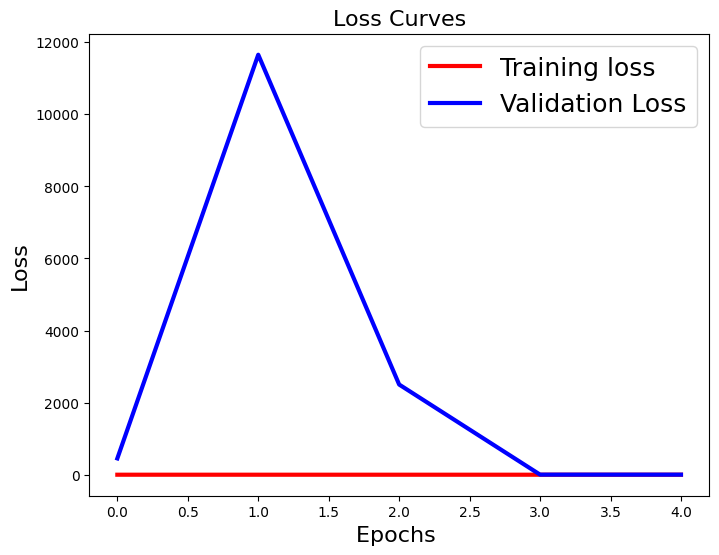

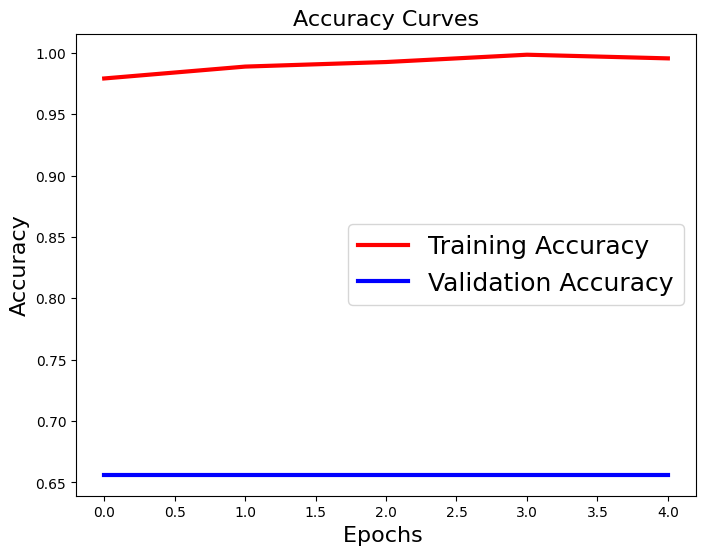

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
model_name='ResNet50.h5'
save_mode(model,model_name)

### **model2 VGG16** 

In [ ]:
model2=VGG16_model(2,'softmax','categorical_crossentropy')

58889256/58889256 [==============================] - 3s 0us/step


In [ ]:
history = model2.fit(clf_df_train,
                    epochs=5,
                    validation_data=clf_df_val)

Epoch 1/5
42/42 [==============================] - 22s 373ms/step - loss: 0.0177 - acc: 0.9896 - val_loss: 3.6655e-07 - val_acc: 1.0000
Epoch 2/5
42/42 [==============================] - 15s 350ms/step - loss: 2.2243e-07 - acc: 1.0000 - val_loss: 1.6838e-07 - val_acc: 1.0000
Epoch 3/5
42/42 [==============================] - 15s 349ms/step - loss: 1.1459e-07 - acc: 1.0000 - val_loss: 1.4789e-07 - val_acc: 1.0000
Epoch 4/5
42/42 [==============================] - 15s 345ms/step - loss: 7.9204e-08 - acc: 1.0000 - val_loss: 7.8230e-08 - val_acc: 1.0000
Epoch 5/5
42/42 [==============================] - 15s 350ms/step - loss: 5.5523e-08 - acc: 1.0000 - val_loss: 5.9977e-08 - val_acc: 1.0000


In [ ]:
test_loss, test_acc = model2.evaluate(clf_df_test)
print('Test accuracy:', test_acc)

9/9 [==============================] - 3s 274ms/step - loss: 0.0000e+00 - acc: 1.0000
Test accuracy: 1.0


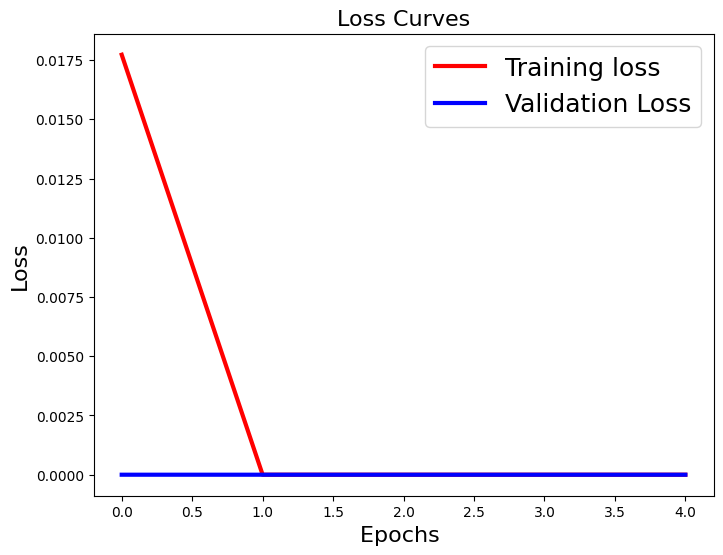

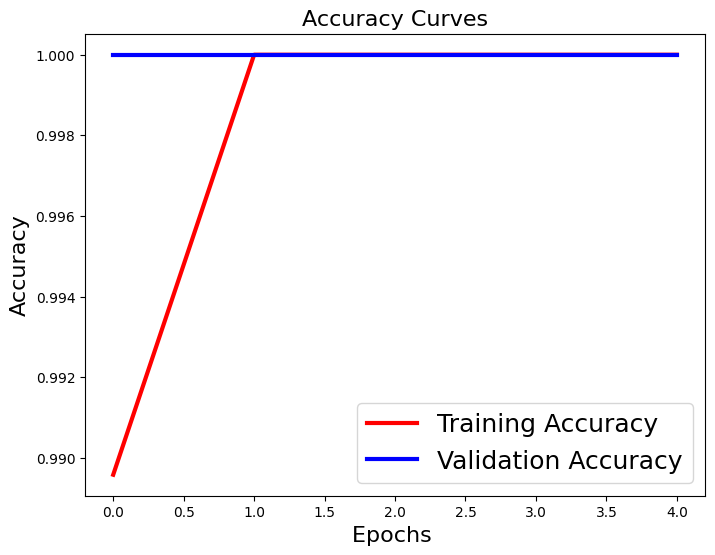

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
model_name='VGG16_model_all_clf.h5'
save_mode(model2,model_name)

### **model3 VGG19** 

In [ ]:
model2=VGG19_model(2,'softmax','categorical_crossentropy')

80134624/80134624 [==============================] - 4s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                              

In [ ]:
history = model2.fit(clf_df_train,
                    epochs=5,
                    validation_data=clf_df_val)

Epoch 1/5
42/42 [==============================] - 25s 402ms/step - loss: 3.9138 - acc: 0.6570 - val_loss: 0.1320 - val_acc: 0.9531
Epoch 2/5
42/42 [==============================] - 17s 398ms/step - loss: 0.1057 - acc: 0.9747 - val_loss: 0.0361 - val_acc: 0.9969
Epoch 3/5
42/42 [==============================] - 16s 381ms/step - loss: 0.2954 - acc: 0.9524 - val_loss: 0.2003 - val_acc: 0.9438
Epoch 4/5
42/42 [==============================] - 16s 381ms/step - loss: 0.7761 - acc: 0.7374 - val_loss: 0.6542 - val_acc: 0.5031
Epoch 5/5
42/42 [==============================] - 16s 383ms/step - loss: 0.9350 - acc: 0.8222 - val_loss: 0.0184 - val_acc: 0.9906


In [ ]:
test_loss, test_acc = model2.evaluate(clf_df_test)
print('Test accuracy:', test_acc)

9/9 [==============================] - 3s 263ms/step - loss: 0.0250 - acc: 0.9965
Test accuracy: 0.9965277910232544


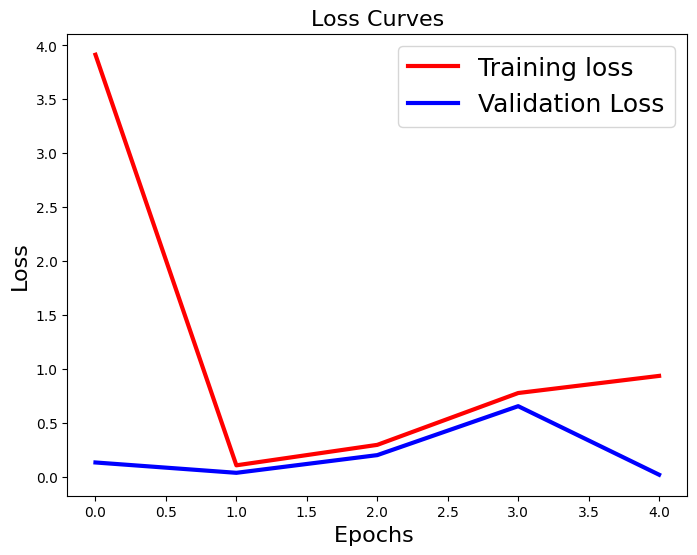

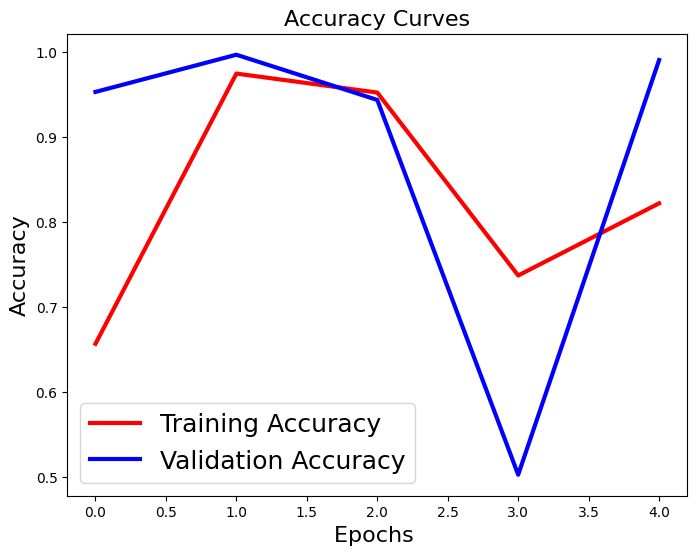

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
# model_name='VGG19_model.h5'
# save_mode(model2,model_name)

## **second stage classification brain**

### **model1 ResNet**

In [ ]:
model=ResNet50_model(2,'softmax','categorical_crossentropy')

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
#history_callback = tf.keras.callbacks.History()
history = model.fit(clf_brain_train,
                    epochs=5,
                    validation_data=clf_brain_val)

Epoch 1/5
25/25 [==============================] - 54s 666ms/step - loss: 0.4980 - acc: 0.8275 - val_loss: 25383.1738 - val_acc: 0.5052
Epoch 2/5
25/25 [==============================] - 11s 450ms/step - loss: 0.2487 - acc: 0.9075 - val_loss: 7.6560 - val_acc: 0.4948
Epoch 3/5
25/25 [==============================] - 12s 457ms/step - loss: 0.0899 - acc: 0.9712 - val_loss: 91.7703 - val_acc: 0.4948
Epoch 4/5
25/25 [==============================] - 11s 452ms/step - loss: 0.0470 - acc: 0.9812 - val_loss: 5.9767 - val_acc: 0.5052
Epoch 5/5
25/25 [==============================] - 11s 450ms/step - loss: 0.0135 - acc: 0.9962 - val_loss: 5.6319 - val_acc: 0.5052


In [ ]:
test_loss, test_acc = model.evaluate(clf_brain_test)
print('Test accuracy:', test_acc)

6/6 [==============================] - 1s 209ms/step - loss: 5.8912 - acc: 0.4792
Test accuracy: 0.4791666567325592


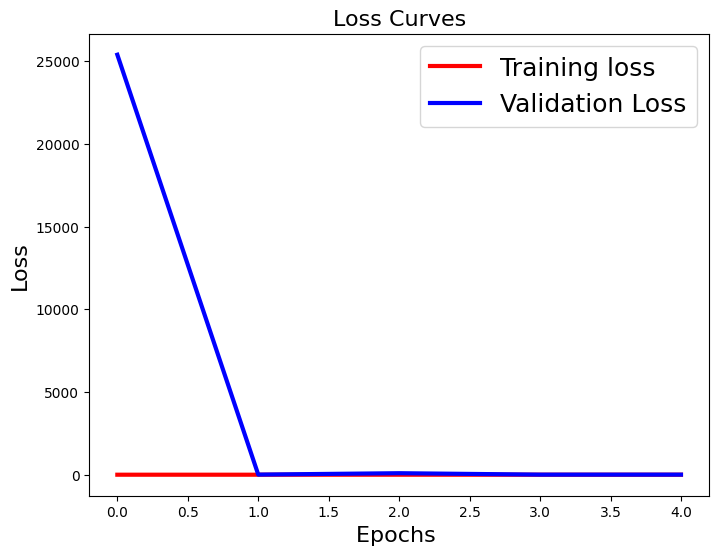

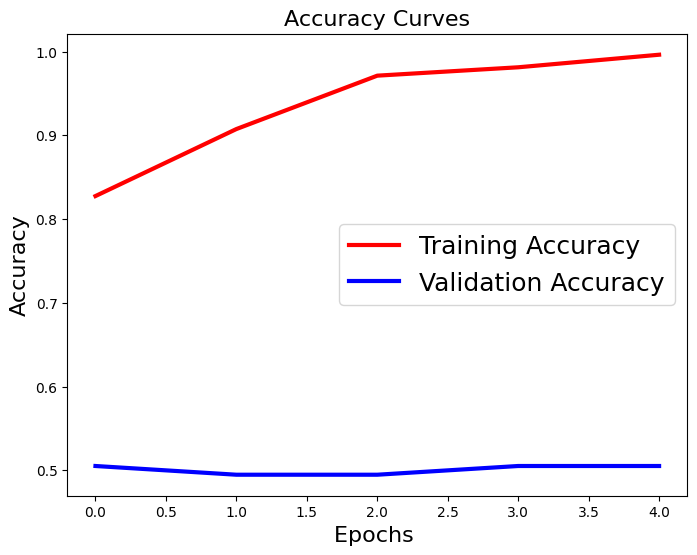

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
# model_name='ResNet50.h5'
# save_mode(model,model_name)

### **model2 VGG16** 

In [ ]:
model2=VGG16_model(2,'softmax','categorical_crossentropy')

In [ ]:
history = model2.fit(clf_brain_train,
                    epochs=5,
                    validation_data=clf_brain_val)

Epoch 1/5
25/25 [==============================] - 8s 276ms/step - loss: 1.7969 - acc: 0.6538 - val_loss: 0.8411 - val_acc: 0.7604
Epoch 2/5
25/25 [==============================] - 8s 309ms/step - loss: 0.4122 - acc: 0.8675 - val_loss: 0.3068 - val_acc: 0.8802
Epoch 3/5
25/25 [==============================] - 6s 254ms/step - loss: 0.1286 - acc: 0.9450 - val_loss: 0.2337 - val_acc: 0.9271
Epoch 4/5
25/25 [==============================] - 7s 255ms/step - loss: 0.0784 - acc: 0.9737 - val_loss: 0.2220 - val_acc: 0.9062
Epoch 5/5
25/25 [==============================] - 7s 268ms/step - loss: 0.0536 - acc: 0.9875 - val_loss: 0.1854 - val_acc: 0.9427


In [ ]:
test_loss, test_acc = model2.evaluate(clf_brain_test)
print('Test accuracy:', test_acc)

6/6 [==============================] - 1s 218ms/step - loss: 0.2148 - acc: 0.9167
Test accuracy: 0.9166666865348816


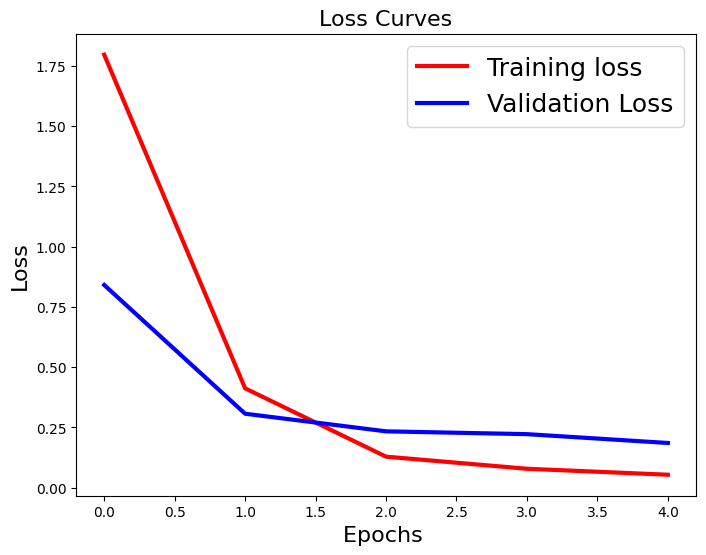

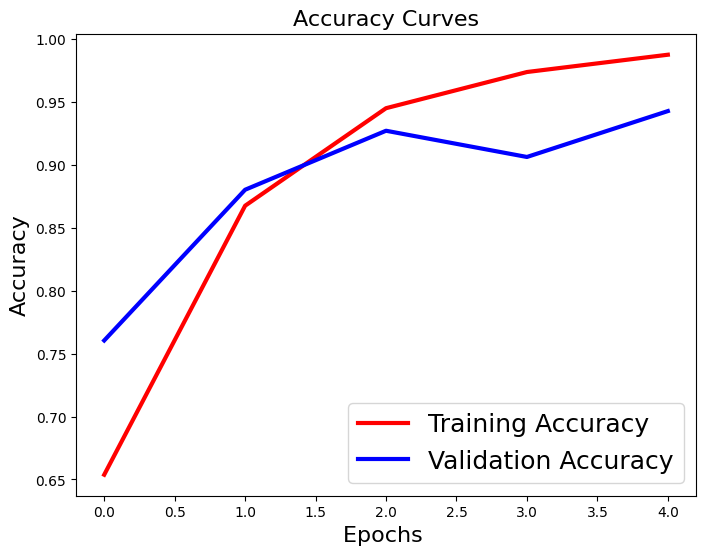

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
model_name='VGG16_model_brain_clf.h5'
save_mode(model2,model_name)

### **model3 VGG19** 

In [ ]:
model2=VGG19_model(2,'softmax','categorical_crossentropy')

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
history = model2.fit(clf_brain_train,
                    epochs=5,
                    validation_data=clf_brain_val)

Epoch 1/5
25/25 [==============================] - 14s 389ms/step - loss: 6.8719 - acc: 0.4863 - val_loss: 0.6931 - val_acc: 0.5052
Epoch 2/5
25/25 [==============================] - 9s 361ms/step - loss: 0.8613 - acc: 0.5013 - val_loss: 0.6931 - val_acc: 0.5052
Epoch 3/5
25/25 [==============================] - 10s 401ms/step - loss: 0.6935 - acc: 0.5025 - val_loss: 0.6931 - val_acc: 0.5052
Epoch 4/5
25/25 [==============================] - 9s 353ms/step - loss: 0.6935 - acc: 0.5025 - val_loss: 0.6931 - val_acc: 0.5052
Epoch 5/5
25/25 [==============================] - 9s 357ms/step - loss: 0.6935 - acc: 0.4700 - val_loss: 0.6932 - val_acc: 0.4948


In [ ]:
test_loss, test_acc = model2.evaluate(clf_brain_test)
print('Test accuracy:', test_acc)

6/6 [==============================] - 1s 205ms/step - loss: 0.6930 - acc: 0.5208
Test accuracy: 0.5208333134651184


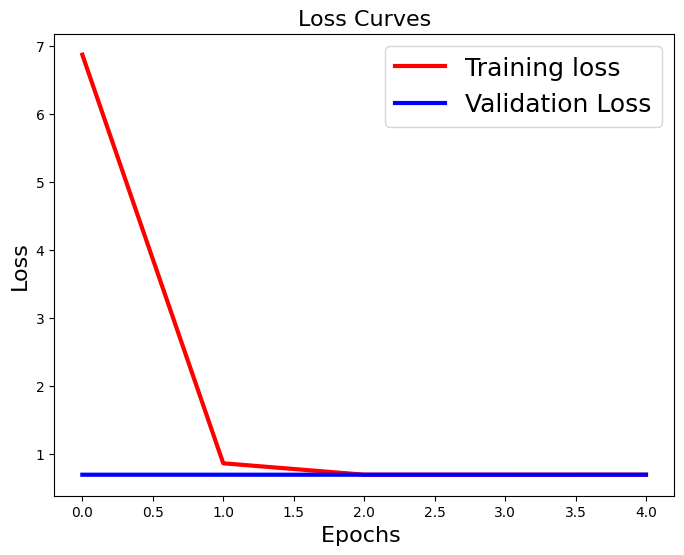

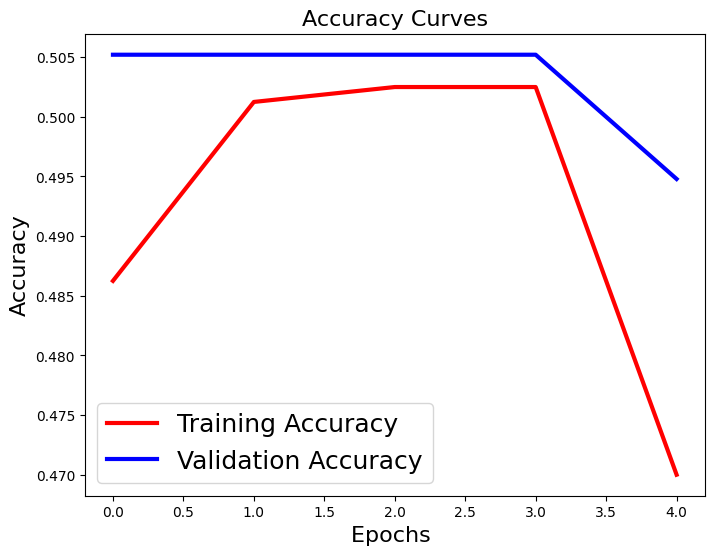

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
# model_name='VGG19_model.h5'
# save_mode(model2,model_name)

## **second stage classification breast**

### **model1 ResNet**

In [ ]:
model=ResNet50_model(3,'softmax','categorical_crossentropy')

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_7[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:

#history_callback = tf.keras.callbacks.History()
history = model.fit(clf_breast_train,
                    epochs=5,
                    validation_data=clf_breast_val)

Epoch 1/5
17/17 [==============================] - 48s 645ms/step - loss: 0.8483 - acc: 0.6875 - val_loss: 791206.6250 - val_acc: 0.5234
Epoch 2/5
17/17 [==============================] - 10s 559ms/step - loss: 0.5710 - acc: 0.8107 - val_loss: 94327.1641 - val_acc: 0.2578
Epoch 3/5
17/17 [==============================] - 10s 566ms/step - loss: 0.4063 - acc: 0.8640 - val_loss: 86827.1250 - val_acc: 0.5234
Epoch 4/5
17/17 [==============================] - 9s 511ms/step - loss: 0.2547 - acc: 0.9136 - val_loss: 2234.4373 - val_acc: 0.5234
Epoch 5/5
17/17 [==============================] - 10s 553ms/step - loss: 0.1171 - acc: 0.9651 - val_loss: 209.8503 - val_acc: 0.5234


In [ ]:
test_loss, test_acc = model.evaluate(clf_breast_test)
print('Test accuracy:', test_acc)

3/3 [==============================] - 8s 4s/step - loss: 261.4126 - acc: 0.4062
Test accuracy: 0.40625


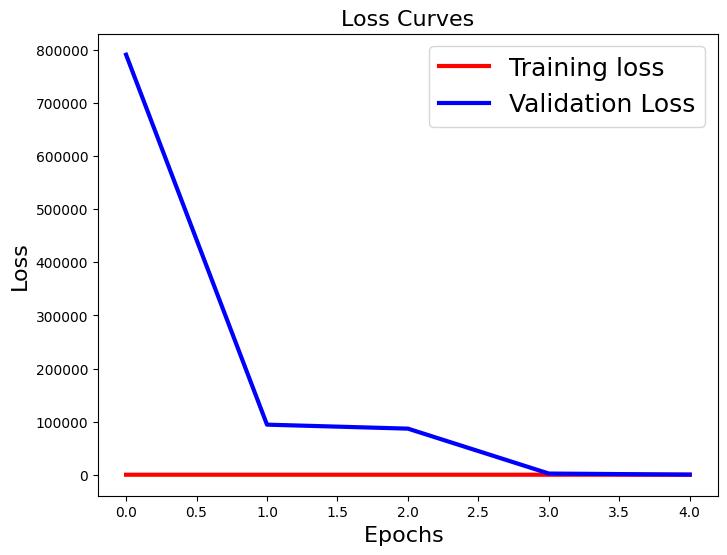

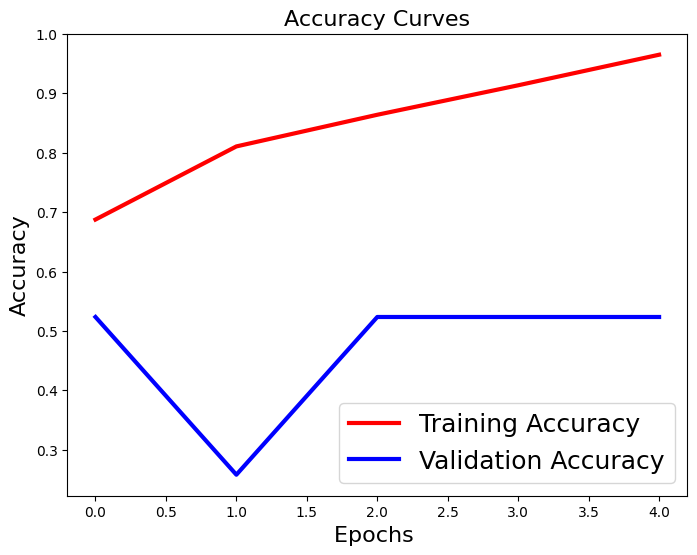

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
# model_name='ResNet50.h5'
# save_mode(model,model_name)

### **model2 VGG16** 

In [ ]:
model2=VGG16_model(3,'softmax','categorical_crossentropy')

In [ ]:
history = model2.fit(clf_breast_train,
                    epochs=5,
                    validation_data=clf_breast_val)

Epoch 1/5
17/17 [==============================] - 10s 530ms/step - loss: 2.4374 - acc: 0.5423 - val_loss: 2.0655 - val_acc: 0.6250
Epoch 2/5
17/17 [==============================] - 8s 463ms/step - loss: 0.8262 - acc: 0.7004 - val_loss: 0.7812 - val_acc: 0.6484
Epoch 3/5
17/17 [==============================] - 9s 503ms/step - loss: 0.3806 - acc: 0.8621 - val_loss: 0.5855 - val_acc: 0.7109
Epoch 4/5
17/17 [==============================] - 8s 493ms/step - loss: 0.2979 - acc: 0.9210 - val_loss: 0.5122 - val_acc: 0.7734
Epoch 5/5
17/17 [==============================] - 9s 535ms/step - loss: 0.2425 - acc: 0.9375 - val_loss: 0.5792 - val_acc: 0.7500


In [ ]:
test_loss, test_acc = model2.evaluate(clf_breast_test)
print('Test accuracy:', test_acc)

3/3 [==============================] - 1s 391ms/step - loss: 0.8709 - acc: 0.6250
Test accuracy: 0.625


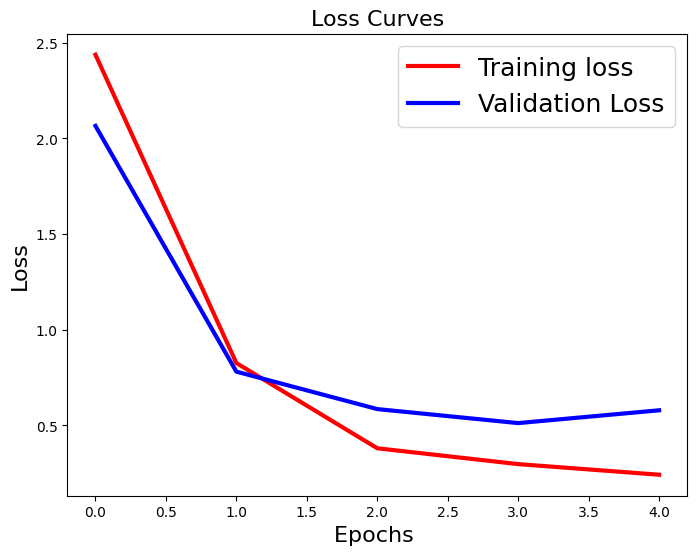

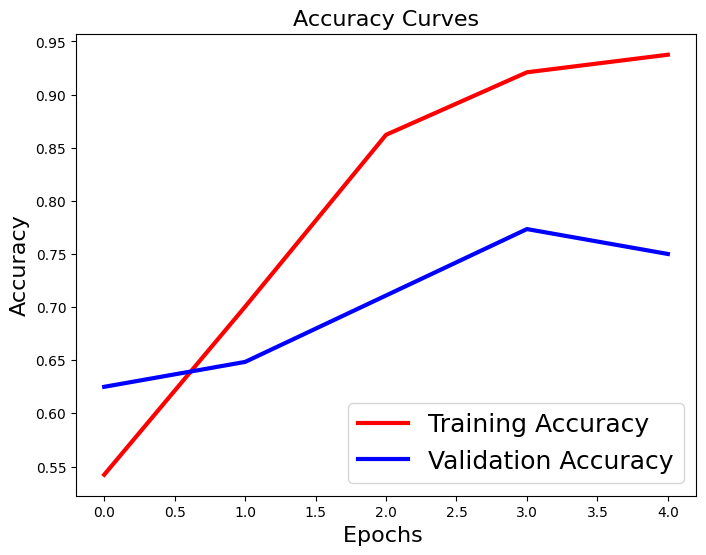

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
model_name='VGG16_model_breast_clf.h5'
save_mode(model2,model_name)

### **model3 VGG19** 

In [ ]:
model2=VGG19_model(3,'softmax','categorical_crossentropy')

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
history = model2.fit(clf_breast_train,
                    epochs=5,
                    validation_data=clf_breast_val)

Epoch 1/5
17/17 [==============================] - 14s 595ms/step - loss: 2.8631 - acc: 0.4853 - val_loss: 1.0939 - val_acc: 0.5234
Epoch 2/5
17/17 [==============================] - 9s 554ms/step - loss: 0.9471 - acc: 0.5882 - val_loss: 1.0717 - val_acc: 0.5234
Epoch 3/5
17/17 [==============================] - 9s 493ms/step - loss: 0.9573 - acc: 0.5974 - val_loss: 1.0379 - val_acc: 0.5234
Epoch 4/5
17/17 [==============================] - 9s 530ms/step - loss: 0.9761 - acc: 0.5551 - val_loss: 1.0808 - val_acc: 0.2578
Epoch 5/5
17/17 [==============================] - 9s 523ms/step - loss: 0.9354 - acc: 0.5570 - val_loss: 1.0168 - val_acc: 0.5234


In [ ]:
test_loss, test_acc = model2.evaluate(clf_breast_test)
print('Test accuracy:', test_acc)

3/3 [==============================] - 1s 370ms/step - loss: 1.1217 - acc: 0.4062
Test accuracy: 0.40625


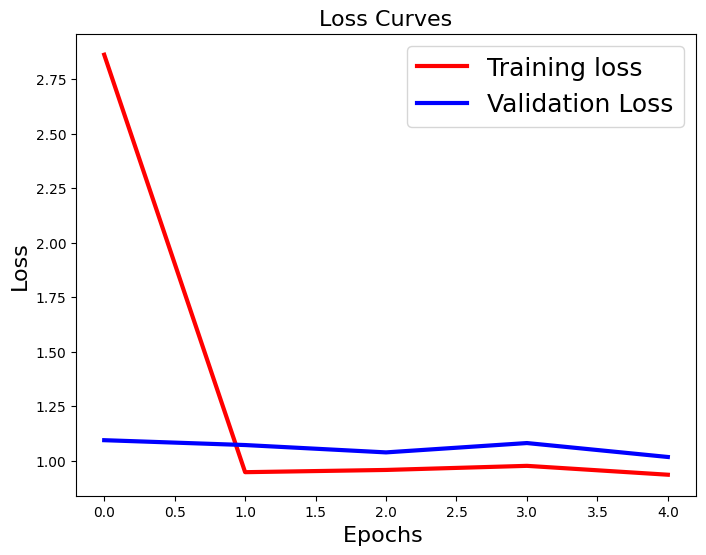

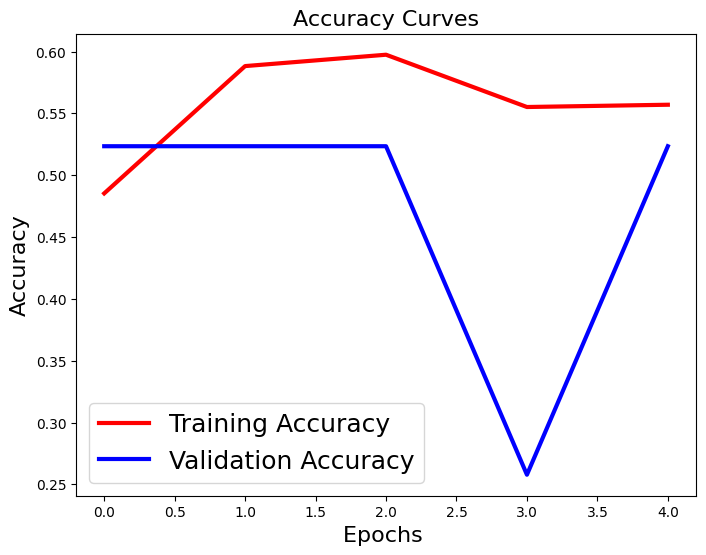

In [ ]:
plot_loss_acc_curves(history)

In [ ]:
# model_name='VGG19_model.h5'
# save_mode(model2,model_name)

# **Segmentation**

#### **functions for models**

In [ ]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')


In [ ]:
# def img_mask(id):

#     path_img=seg_brain_test_df['img_name'].iloc[id]
#   #resizing the image and coverting them to array of type float64
#     img =  cv2.imread(path_img, cv2.IMREAD_COLOR)
#     img = cv2.resize(img, (256,256))
#     img=  img.reshape(256,256,3)
#     img = np.array(img, dtype=np.float64)

#   # standardising the image
#     img = img/225

#     path_mask=seg_brain_test_df['label'].iloc[id]
#   #resizing the image and coverting them to array of type float64
#     mask =  cv2.imread(path_mask, cv2.IMREAD_COLOR)
#     mask = cv2.resize(mask, (256,256))
#     mask=  mask.reshape(256,256,3)
#     mask = np.array(mask, dtype=np.float64)

#   # standardising the image
#     mask = mask/225
     
#     return img,mask

In [ ]:
def img_mask(id, size=256):

    path_img=seg_brain_test_df['img_name'].iloc[id]
    #resizing the image and converting it to array of type float32
    img =  cv2.imread(path_img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (size, size))
    img = np.array(img, dtype=np.float32)
    img /= 255.0

    path_mask=seg_brain_test_df['label'].iloc[id]
    #resizing the image and converting it to array of type float32
    mask =  cv2.imread(path_mask, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (size, size))
    mask = np.array(mask, dtype=np.float32)
    mask /= 255.0
     
    return img, mask


In [ ]:
# Define a function to preprocess the test images for prediction
def preprocess_test_image(img_path, img_h, img_w):
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (img_h, img_w))
    img = img.reshape(1, img_h, img_w, 3)
    img = np.array(img, dtype=np.float64)
    img /= 255.
    return img

In [ ]:
# class ShowProgress(Callback):
#     def on_epoch_end(self, epochs, logs=None):
#         id = np.random.randint(200)
#         exp = GradCAM()
#         image, mask = img_mask(id)

#         # image = image.reshape(256, 256, 3)
#         pred_mask = self.model.predict(image[np.newaxis,...])
#         # print(pred_mask)

#         # Read the test image and its corresponding mask
#         # pred_mask = cv2.imread(pred_mask, cv2.IMREAD_COLOR)
        
#         # # Resize the test image and mask to the set height and width
#         # pred_mask = cv2.resize(pred_mask, (256, 256))
#         # pred_mask=pred_mask.reshape(256,256,3)
#         # pred_mask = np.array(pred_mask, dtype=np.float32)
#         # # Normalize the test image and mask
#         # pred_mask = pred_mask / 255.

        
#         cam = exp.explain(
#             validation_data=(image[np.newaxis,...], mask),
#             class_index=1,
#             layer_name='final_conv',
#             model=self.model
#         )

#         plt.figure(figsize=(10,5))

#         plt.subplot(1,3,1)
#         plt.title("Original Mask")
#         show_mask(image, mask, cmap='copper')

#         plt.subplot(1,3,2)
#         plt.title("Predicted Mask")
#         show_mask(image, pred_mask.reshape(256, 256), cmap='copper')

#         plt.subplot(1,3,3)
#         show_image(cam,title="GradCAM")

#         plt.tight_layout()
#         plt.show()

In [ ]:
# version 3

# class ShowProgress(Callback):
#     def on_epoch_end(self, epochs, logs=None):
#         id = np.random.randint(200)
#         exp = GradCAM()
#         image, mask = img_mask(id)

#         # Get the predicted mask from the model
#         pred_mask = self.model.predict(image[np.newaxis,...])
#         # Convert the predicted mask to a proper shape and normalize it
#         pred_mask = pred_mask[0,:,:,0]
#         pred_mask = cv2.resize(pred_mask, (256, 256))
#         pred_mask = np.array(pred_mask, dtype=np.float32)
#         pred_mask /= 255.0

#         cam = exp.explain(
#             validation_data=(image[np.newaxis,...], mask),
#             class_index=1,
#             layer_name='final_conv',
#             model=self.model
#         )

#         plt.figure(figsize=(10,5))

#         plt.subplot(1,3,1)
#         plt.title("Original Mask")
#         show_mask(image, mask, cmap='copper')

#         plt.subplot(1,3,2)
#         plt.title("Predicted Mask")
#         show_mask(image, pred_mask, cmap='copper')

#         plt.subplot(1,3,3)
#         show_image(cam,title="GradCAM")

#         plt.tight_layout()
#         plt.show()

In [ ]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image, mask = img_mask(id)

        # Get the predicted mask from the model
        pred_mask = self.model.predict(image[np.newaxis,...])
        # Convert the predicted mask to a proper shape and normalize it
        pred_mask = pred_mask[0,:,:,0]
        pred_mask = cv2.resize(pred_mask, (256, 256))
        pred_mask = np.array(pred_mask, dtype=np.float32)
        pred_mask /= 255.0

        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='final_conv',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

In [ ]:
def Unet_model():
  BACKBONE = 'vgg19'
  preprocess_input = sm.get_preprocessing(BACKBONE)


  # define optomizer
  optim = keras.optimizers.Adam(0.0001)

  # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
  dice_loss = sm.losses.DiceLoss()
  focal_loss = sm.losses.BinaryFocalLoss()
  total_loss = dice_loss + (1 * focal_loss)

  # actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
  # total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 

  metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

  # define model
  model = sm.Unet(BACKBONE, input_shape=(256, 256,3),  classes=1, activation='sigmoid', encoder_weights='imagenet', encoder_freeze=True)
  # compile keras model with defined optimozer, loss and metrics
  model.compile(optim, total_loss, metrics)

  return model

In [ ]:
7def  Plot_train_val_iou_score(history):
  plt.figure(figsize=(30, 5))
  plt.subplot(121)
  plt.plot(history.history['iou_score'])
  plt.plot(history.history['val_iou_score'])
  plt.title('Model iou_score')
  plt.ylabel('iou_score')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')

  # Plot training & validation loss values
  plt.subplot(122)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

In [ ]:
def segmentation_test_prediction(test_image_paths,test_mask_paths):
    # Set the image height and width
    img_h, img_w = 256, 256
    # Loop over the test images and generate the predicted masks
    for i in range(len(test_image_paths)):
        # Preprocess the test image for prediction
        test_image = preprocess_test_image(test_image_paths[i], img_h, img_w)
        
        # Generate the predicted mask for the test image
        predicted_mask = model.predict(test_image)
        
        # Read the test image and its corresponding mask
        test_image = cv2.imread(test_image_paths[i], cv2.IMREAD_COLOR)
        test_mask = cv2.imread(test_mask_paths[i], cv2.IMREAD_COLOR)
        
        # Resize the test image and mask to the set height and width
        test_image = cv2.resize(test_image, (img_h, img_w))
        test_mask = cv2.resize(test_mask, (img_h, img_w))
        test_image=test_image.reshape(256,256,3)
        test_mask=test_mask.reshape(256,256,3)
        
        # Normalize the test image and mask
        test_image = test_image / 255.
        test_mask = test_mask / 255.
        
        # Create a plot with three subplots: the test image, the true mask, and the predicted mask
        fig, axs = plt.subplots(1, 3, figsize=(10, 5))
        axs[0].imshow(test_image, cmap='gray')
        axs[0].set_title('Test Image')
        axs[1].imshow(test_mask, cmap='gray')
        axs[1].set_title('True Mask')
        axs[2].imshow(predicted_mask.reshape(img_h, img_w), cmap='gray')
        axs[2].set_title('Predicted Mask')
        plt.show()



### **Model brain segmentation**

Epoch 1/50
1/1 [==============================] - 2s 2s/step


/usr/local/lib/python3.9/dist-packages/tf_explain/utils/display.py:112: RuntimeWarning: invalid value encountered in true_divide
  heatmap = (heatmap - np.min(heatmap)) / (heatmap.max() - heatmap.min())


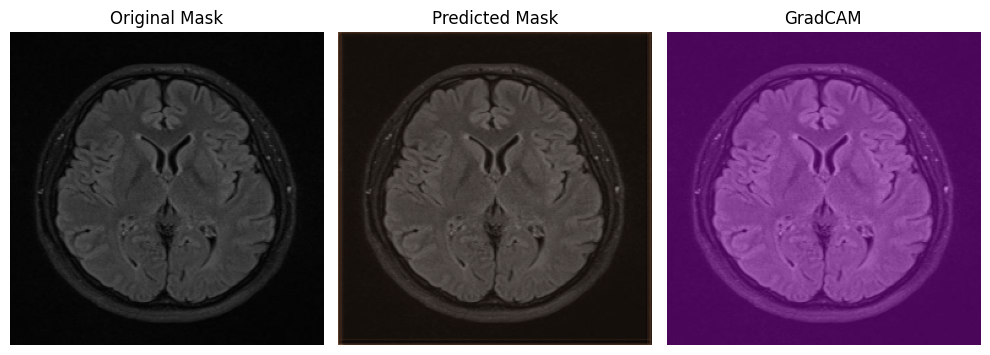

100/100 [==============================] - 67s 608ms/step - loss: 1.0155 - iou_score: 0.0903 - f1-score: 0.1591 - val_loss: 1.0000 - val_iou_score: 0.0938 - val_f1-score: 0.1683
Epoch 2/50
1/1 [==============================] - 0s 26ms/step


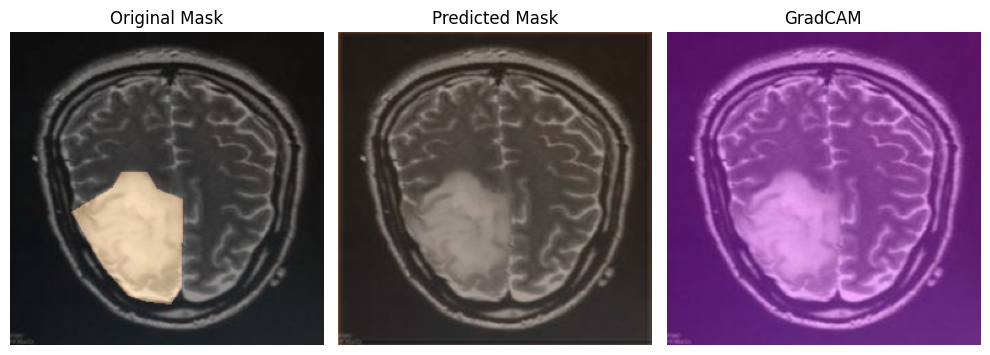

100/100 [==============================] - 22s 215ms/step - loss: 0.9349 - iou_score: 0.2117 - f1-score: 0.3328 - val_loss: 0.9477 - val_iou_score: 0.1545 - val_f1-score: 0.2619
Epoch 3/50
1/1 [==============================] - 0s 21ms/step


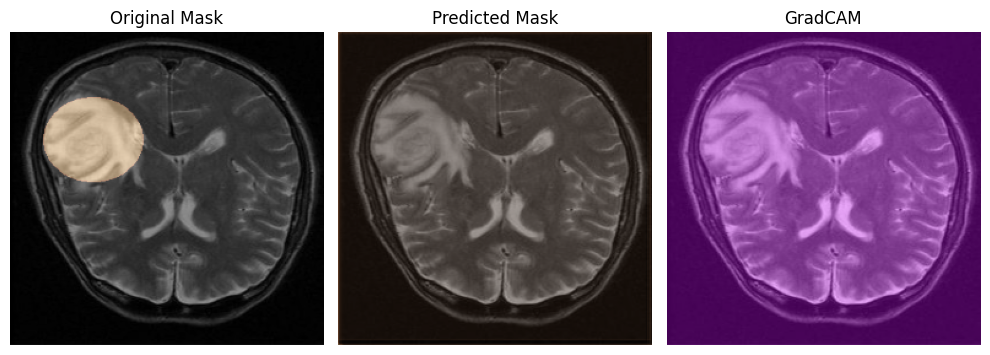

100/100 [==============================] - 30s 291ms/step - loss: 0.8983 - iou_score: 0.2646 - f1-score: 0.3965 - val_loss: 0.9337 - val_iou_score: 0.1725 - val_f1-score: 0.2849
Epoch 4/50
1/1 [==============================] - 0s 32ms/step


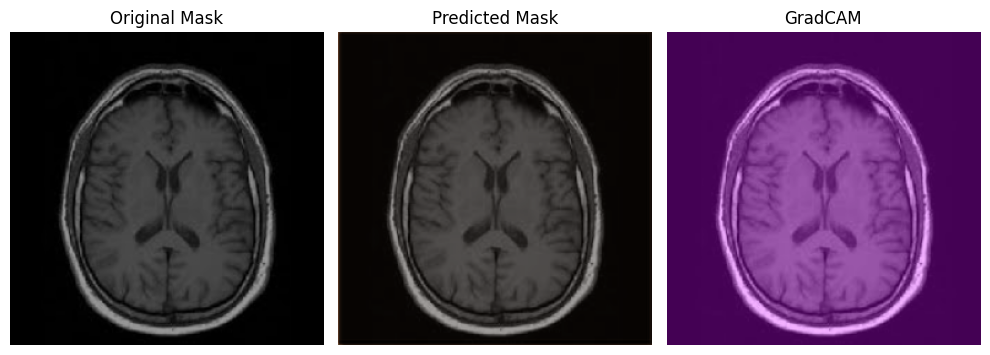

100/100 [==============================] - 24s 237ms/step - loss: 0.8564 - iou_score: 0.2857 - f1-score: 0.4181 - val_loss: 0.8218 - val_iou_score: 0.2999 - val_f1-score: 0.4497
Epoch 5/50
1/1 [==============================] - 0s 36ms/step


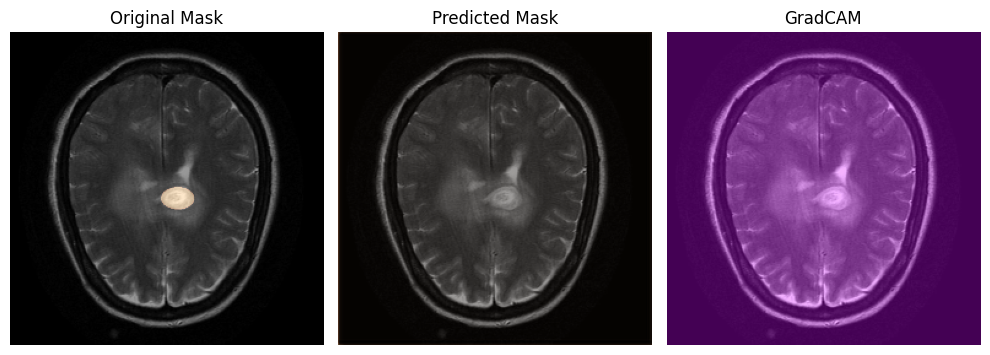

100/100 [==============================] - 33s 332ms/step - loss: 0.8123 - iou_score: 0.2938 - f1-score: 0.4320 - val_loss: 0.8126 - val_iou_score: 0.2863 - val_f1-score: 0.4233
Epoch 6/50
1/1 [==============================] - 0s 19ms/step


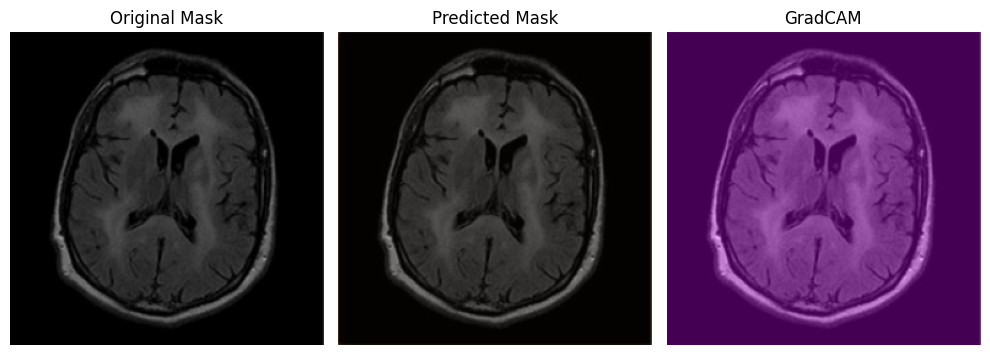

100/100 [==============================] - 26s 260ms/step - loss: 0.7409 - iou_score: 0.3298 - f1-score: 0.4703 - val_loss: 0.6787 - val_iou_score: 0.3666 - val_f1-score: 0.5103
Epoch 7/50
1/1 [==============================] - 0s 21ms/step


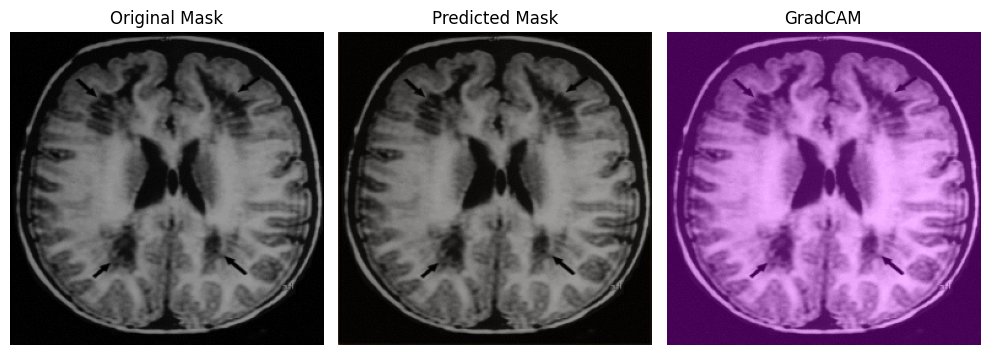

100/100 [==============================] - 25s 248ms/step - loss: 0.6621 - iou_score: 0.3649 - f1-score: 0.5127 - val_loss: 0.6474 - val_iou_score: 0.3557 - val_f1-score: 0.4939
Epoch 8/50
1/1 [==============================] - 0s 21ms/step


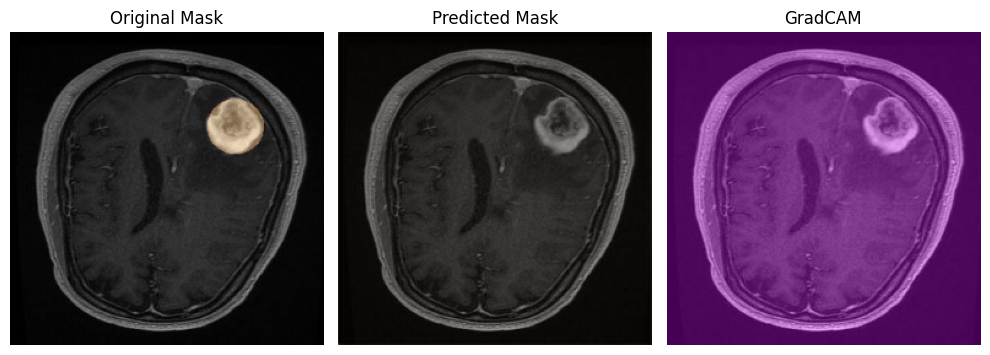

100/100 [==============================] - 22s 220ms/step - loss: 0.5758 - iou_score: 0.4101 - f1-score: 0.5636 - val_loss: 0.6750 - val_iou_score: 0.2925 - val_f1-score: 0.4236
Epoch 9/50
1/1 [==============================] - 0s 30ms/step


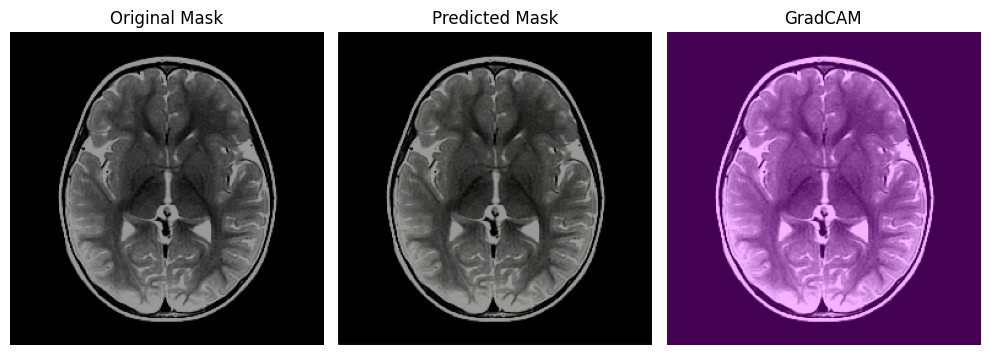

100/100 [==============================] - 22s 223ms/step - loss: 0.4575 - iou_score: 0.5098 - f1-score: 0.6591 - val_loss: 0.4080 - val_iou_score: 0.5270 - val_f1-score: 0.6783
Epoch 10/50
1/1 [==============================] - 0s 22ms/step


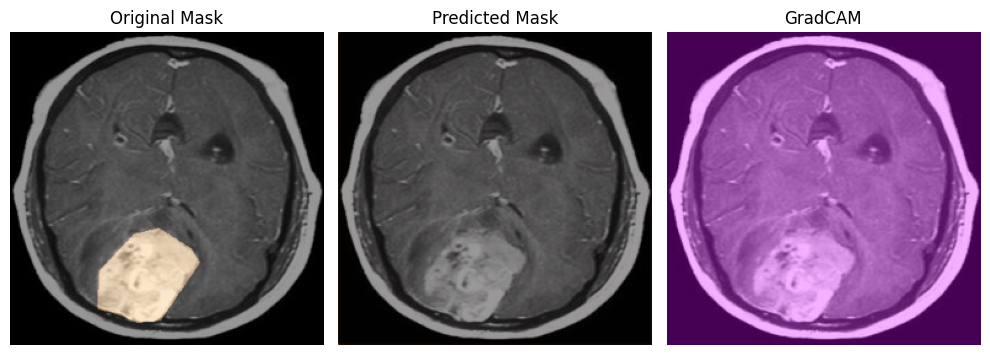

100/100 [==============================] - 30s 303ms/step - loss: 0.4005 - iou_score: 0.5479 - f1-score: 0.6913 - val_loss: 0.4509 - val_iou_score: 0.4643 - val_f1-score: 0.6198
Epoch 11/50
1/1 [==============================] - 0s 27ms/step


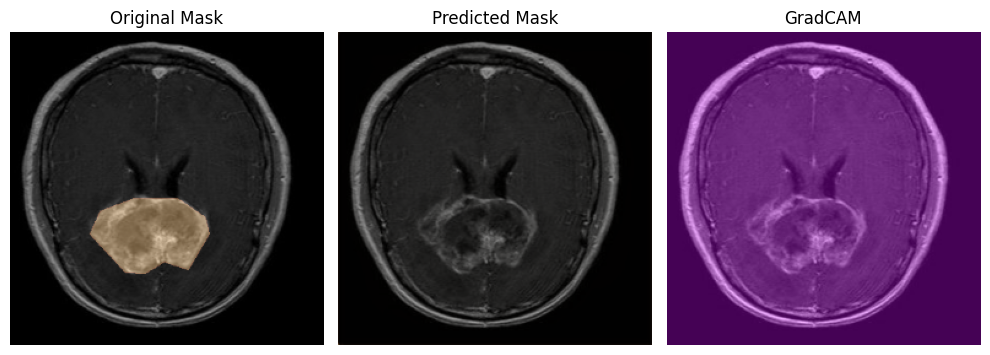

100/100 [==============================] - 23s 224ms/step - loss: 0.3748 - iou_score: 0.5568 - f1-score: 0.7016 - val_loss: 0.3635 - val_iou_score: 0.5812 - val_f1-score: 0.7248
Epoch 12/50
1/1 [==============================] - 0s 24ms/step


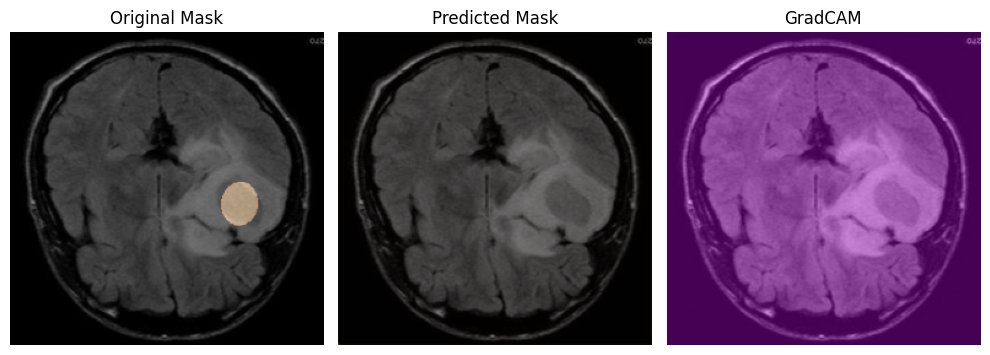

100/100 [==============================] - 22s 216ms/step - loss: 0.3315 - iou_score: 0.5963 - f1-score: 0.7330 - val_loss: 0.3989 - val_iou_score: 0.5458 - val_f1-score: 0.6980
Epoch 13/50
1/1 [==============================] - 0s 37ms/step


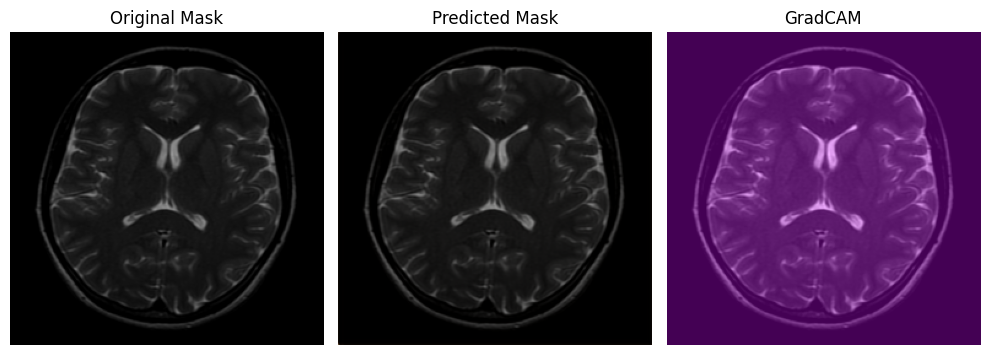

100/100 [==============================] - 23s 227ms/step - loss: 0.2945 - iou_score: 0.6287 - f1-score: 0.7608 - val_loss: 0.3188 - val_iou_score: 0.5910 - val_f1-score: 0.7344
Epoch 14/50
1/1 [==============================] - 0s 24ms/step


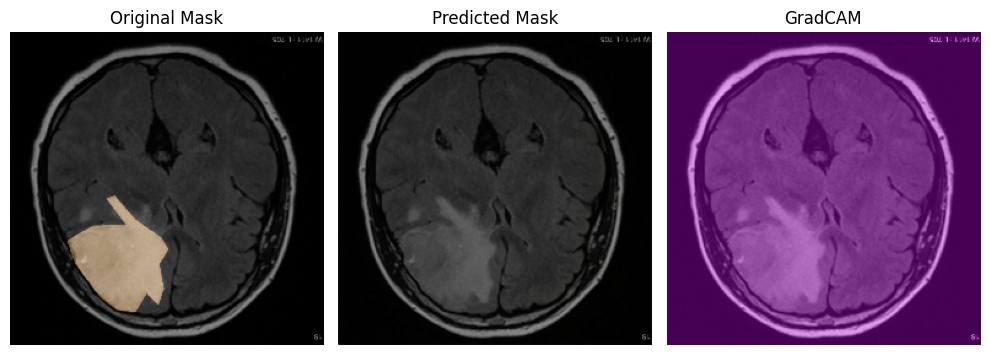

100/100 [==============================] - 22s 222ms/step - loss: 0.3290 - iou_score: 0.5903 - f1-score: 0.7245 - val_loss: 0.3978 - val_iou_score: 0.5017 - val_f1-score: 0.6494
Epoch 15/50
1/1 [==============================] - 0s 25ms/step


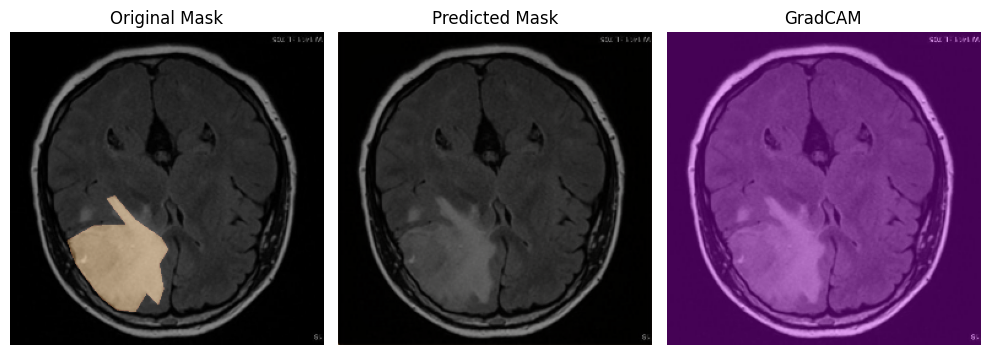

100/100 [==============================] - 23s 229ms/step - loss: 0.2988 - iou_score: 0.6169 - f1-score: 0.7485 - val_loss: 0.2617 - val_iou_score: 0.6439 - val_f1-score: 0.7781
Epoch 16/50
1/1 [==============================] - 0s 27ms/step


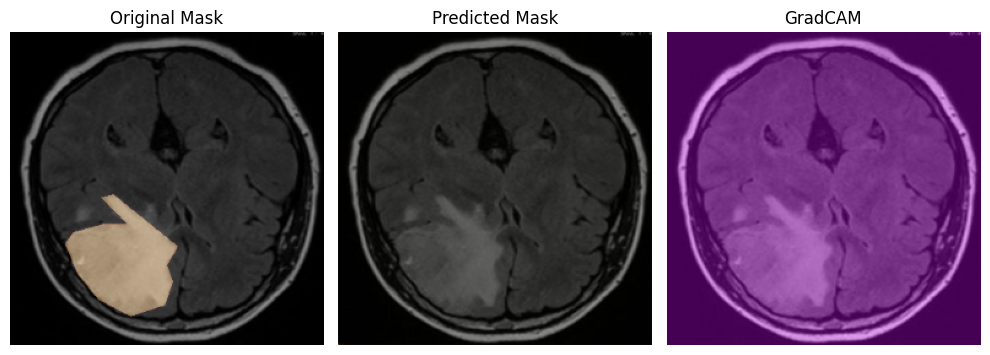

100/100 [==============================] - 24s 234ms/step - loss: 0.2686 - iou_score: 0.6471 - f1-score: 0.7760 - val_loss: 0.3033 - val_iou_score: 0.6002 - val_f1-score: 0.7387
Epoch 17/50
1/1 [==============================] - 0s 25ms/step


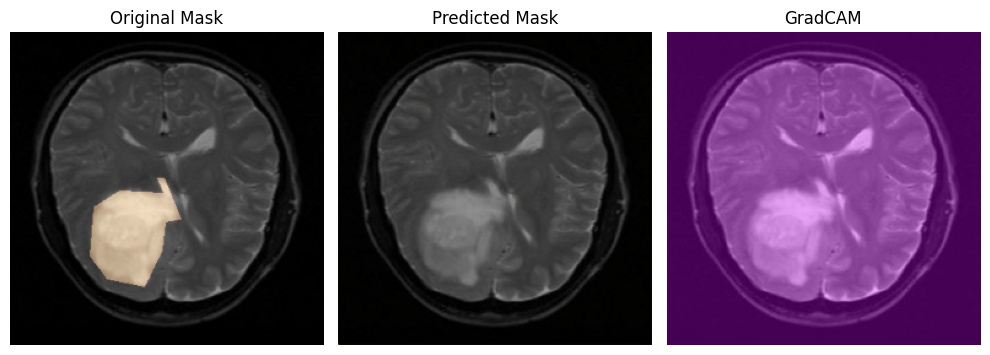

100/100 [==============================] - 24s 235ms/step - loss: 0.2459 - iou_score: 0.6734 - f1-score: 0.7945 - val_loss: 0.2661 - val_iou_score: 0.6531 - val_f1-score: 0.7832
Epoch 18/50
1/1 [==============================] - 0s 27ms/step


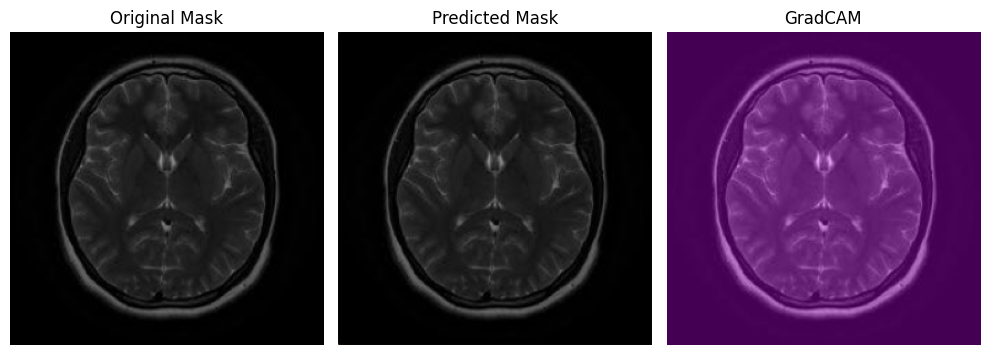

100/100 [==============================] - 22s 223ms/step - loss: 0.2498 - iou_score: 0.6678 - f1-score: 0.7898 - val_loss: 0.2702 - val_iou_score: 0.6472 - val_f1-score: 0.7750
Epoch 19/50
1/1 [==============================] - 0s 24ms/step


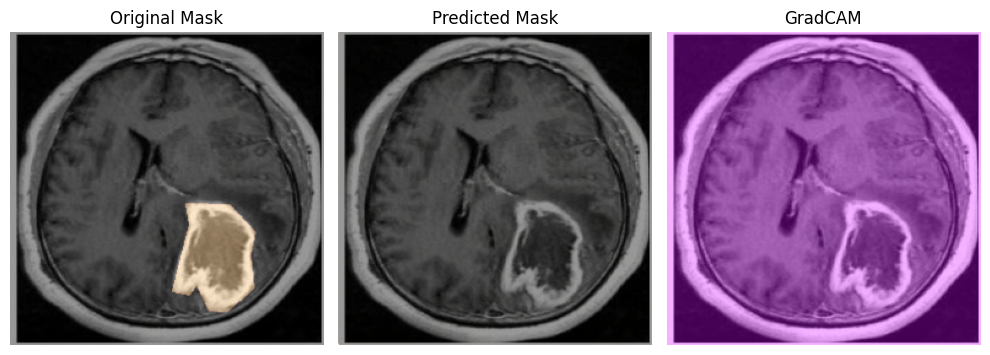

100/100 [==============================] - 24s 234ms/step - loss: 0.2384 - iou_score: 0.6763 - f1-score: 0.7988 - val_loss: 0.3239 - val_iou_score: 0.5802 - val_f1-score: 0.7200
Epoch 20/50
1/1 [==============================] - 0s 25ms/step


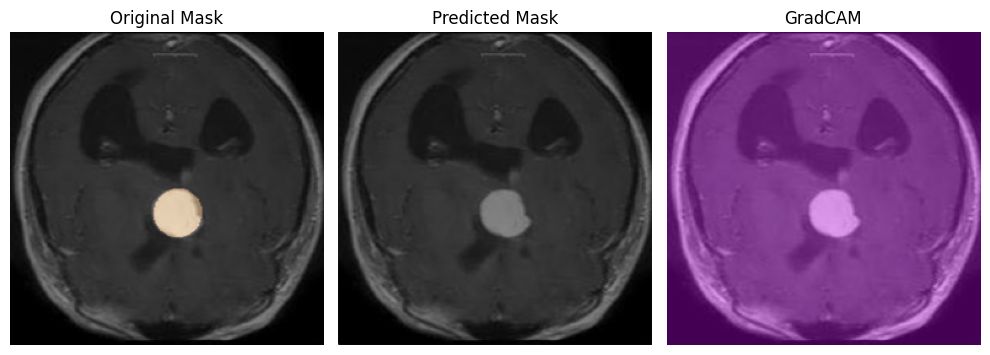

100/100 [==============================] - 24s 236ms/step - loss: 0.2478 - iou_score: 0.6665 - f1-score: 0.7877 - val_loss: 0.2359 - val_iou_score: 0.6854 - val_f1-score: 0.8047
Epoch 21/50
1/1 [==============================] - 0s 27ms/step


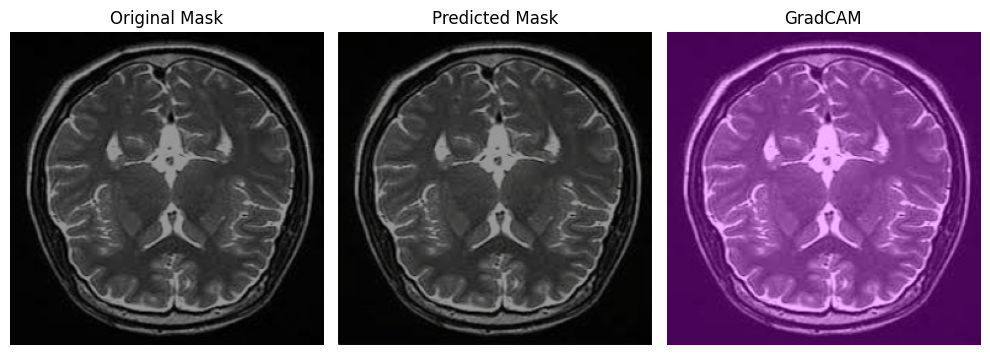

100/100 [==============================] - 23s 224ms/step - loss: 0.2203 - iou_score: 0.6976 - f1-score: 0.8123 - val_loss: 0.2477 - val_iou_score: 0.6777 - val_f1-score: 0.8000
Epoch 22/50
1/1 [==============================] - 0s 22ms/step


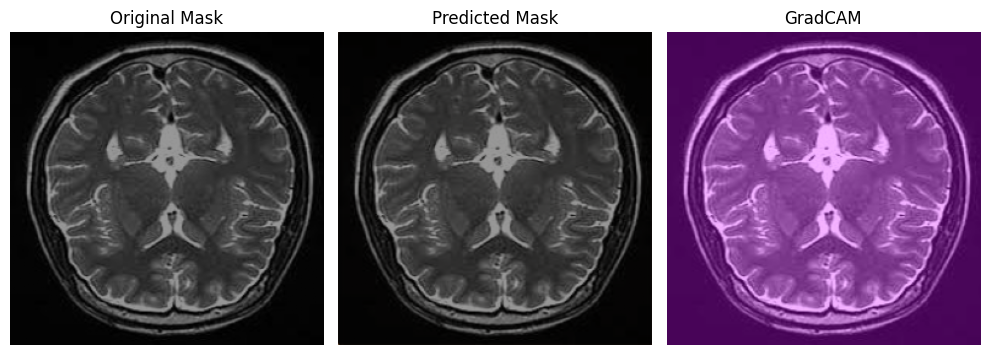

100/100 [==============================] - 23s 228ms/step - loss: 0.2004 - iou_score: 0.7241 - f1-score: 0.8311 - val_loss: 0.2319 - val_iou_score: 0.6847 - val_f1-score: 0.8050
Epoch 23/50
1/1 [==============================] - 0s 25ms/step


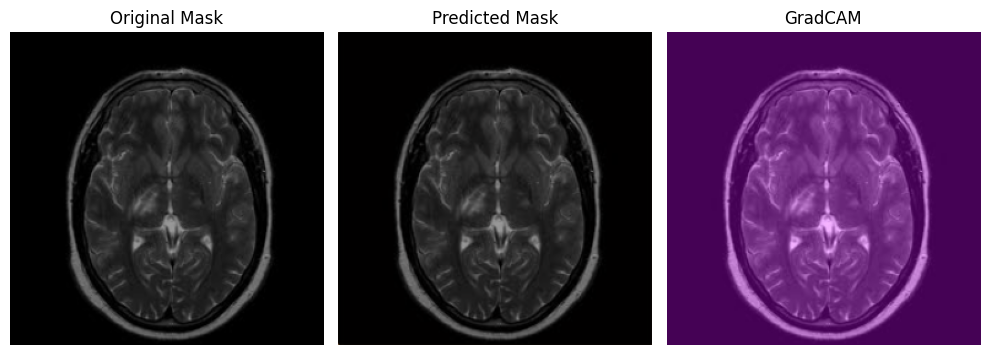

100/100 [==============================] - 24s 241ms/step - loss: 0.2211 - iou_score: 0.6973 - f1-score: 0.8100 - val_loss: 0.2225 - val_iou_score: 0.6929 - val_f1-score: 0.8116
Epoch 24/50
1/1 [==============================] - 0s 34ms/step


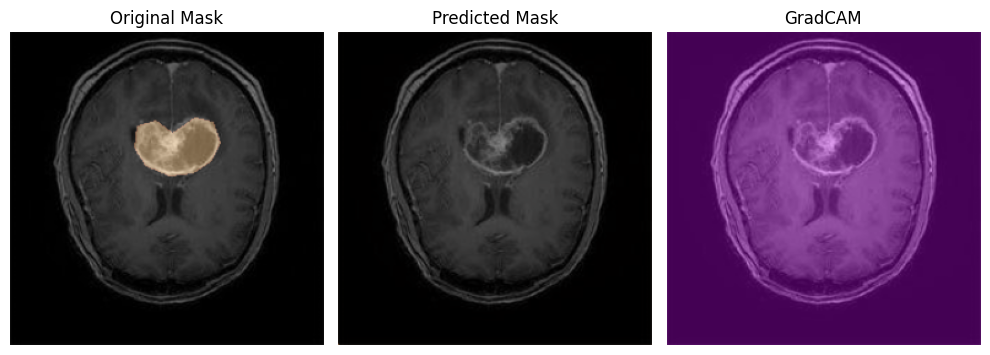

100/100 [==============================] - 24s 235ms/step - loss: 0.2327 - iou_score: 0.6813 - f1-score: 0.8002 - val_loss: 0.2315 - val_iou_score: 0.6833 - val_f1-score: 0.8043
Epoch 25/50
1/1 [==============================] - 0s 22ms/step


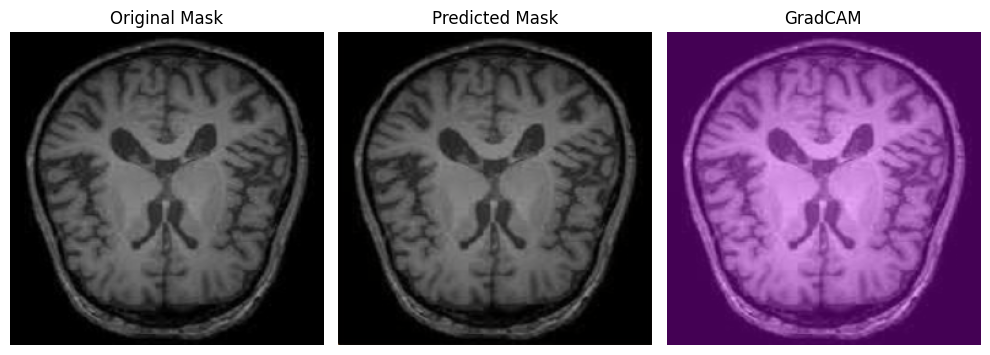

100/100 [==============================] - 23s 231ms/step - loss: 0.2045 - iou_score: 0.7172 - f1-score: 0.8254 - val_loss: 0.3237 - val_iou_score: 0.5864 - val_f1-score: 0.7171
Epoch 26/50
1/1 [==============================] - 0s 21ms/step


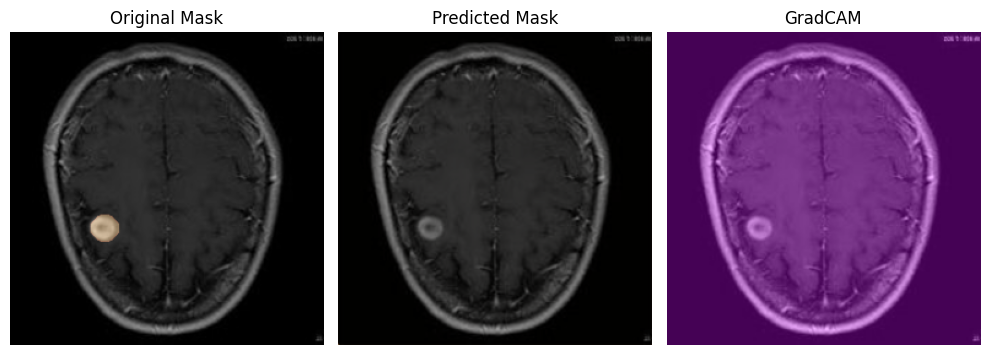

100/100 [==============================] - 25s 248ms/step - loss: 0.1969 - iou_score: 0.7253 - f1-score: 0.8311 - val_loss: 0.2333 - val_iou_score: 0.6805 - val_f1-score: 0.8003
Epoch 27/50
1/1 [==============================] - 0s 22ms/step


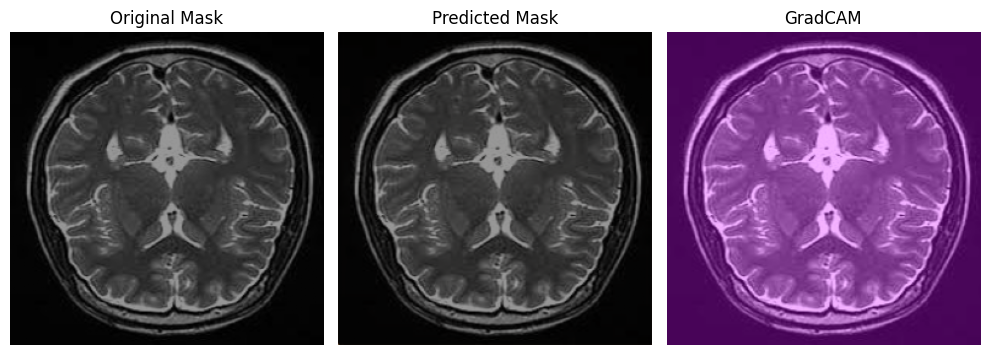

100/100 [==============================] - 24s 239ms/step - loss: 0.2052 - iou_score: 0.7153 - f1-score: 0.8250 - val_loss: 0.2792 - val_iou_score: 0.6465 - val_f1-score: 0.7801
Epoch 28/50
1/1 [==============================] - 0s 21ms/step


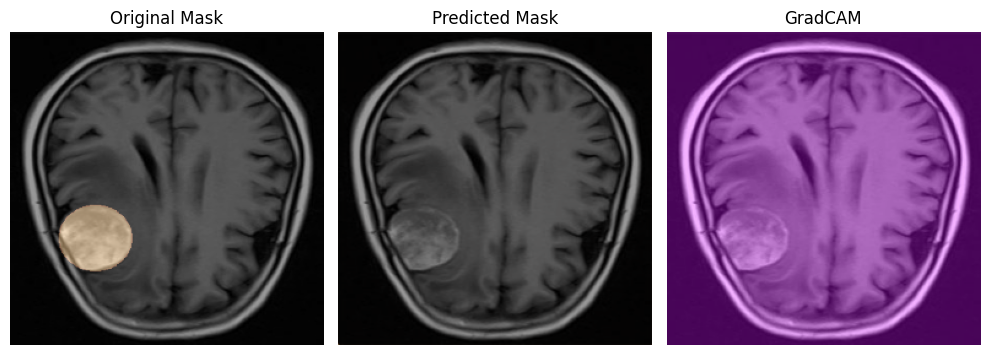

100/100 [==============================] - 23s 232ms/step - loss: 0.1906 - iou_score: 0.7301 - f1-score: 0.8378 - val_loss: 0.2381 - val_iou_score: 0.6822 - val_f1-score: 0.7970
Epoch 29/50
1/1 [==============================] - 0s 23ms/step


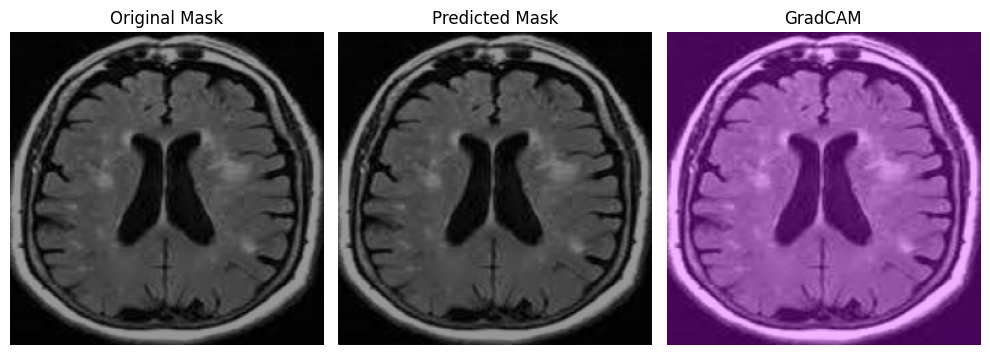

100/100 [==============================] - 25s 246ms/step - loss: 0.1877 - iou_score: 0.7331 - f1-score: 0.8391 - val_loss: 0.2521 - val_iou_score: 0.6503 - val_f1-score: 0.7787
Epoch 30/50
1/1 [==============================] - 0s 23ms/step


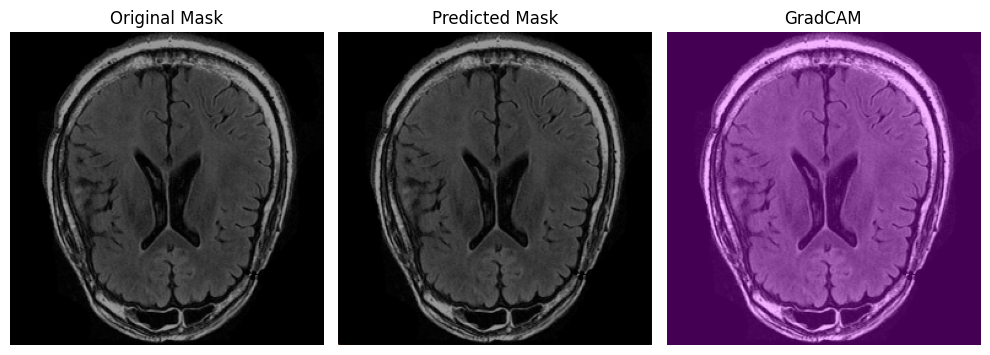

100/100 [==============================] - 26s 256ms/step - loss: 0.2043 - iou_score: 0.7147 - f1-score: 0.8243 - val_loss: 0.2207 - val_iou_score: 0.6988 - val_f1-score: 0.8161
Epoch 31/50
1/1 [==============================] - 0s 21ms/step


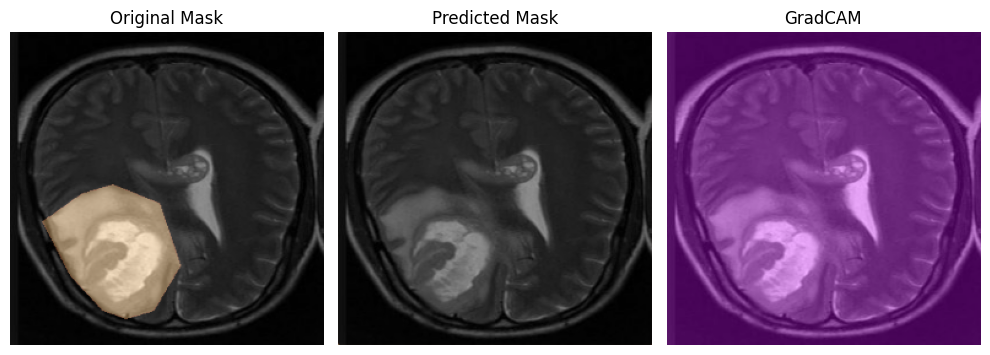

100/100 [==============================] - 25s 246ms/step - loss: 0.2003 - iou_score: 0.7193 - f1-score: 0.8267 - val_loss: 1.3075 - val_iou_score: 0.1226 - val_f1-score: 0.2142
Epoch 32/50
1/1 [==============================] - 0s 21ms/step


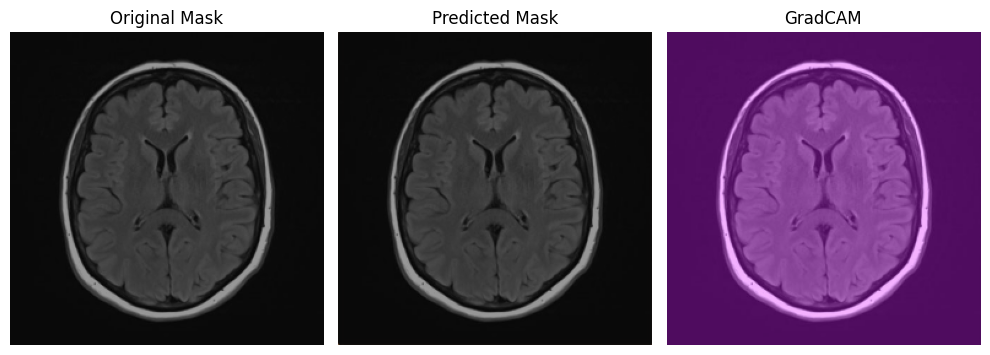

100/100 [==============================] - 25s 249ms/step - loss: 0.2142 - iou_score: 0.7009 - f1-score: 0.8147 - val_loss: 0.2518 - val_iou_score: 0.6570 - val_f1-score: 0.7830
Epoch 33/50
1/1 [==============================] - 0s 23ms/step


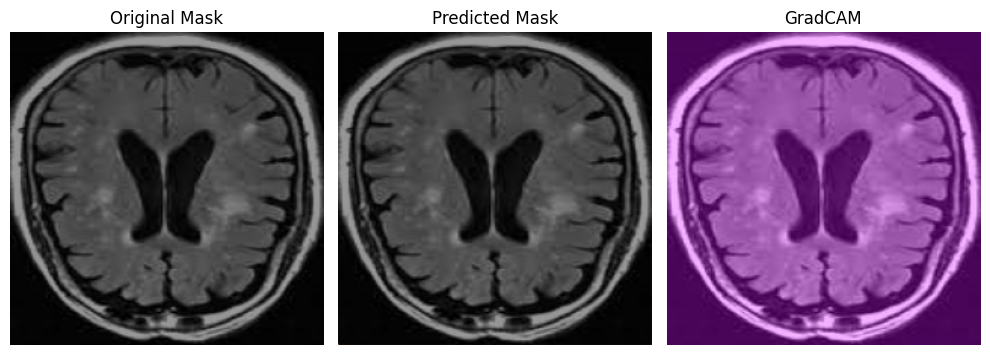

100/100 [==============================] - 26s 257ms/step - loss: 0.1848 - iou_score: 0.7351 - f1-score: 0.8411 - val_loss: 0.3114 - val_iou_score: 0.5879 - val_f1-score: 0.7295
Epoch 34/50
1/1 [==============================] - 0s 26ms/step


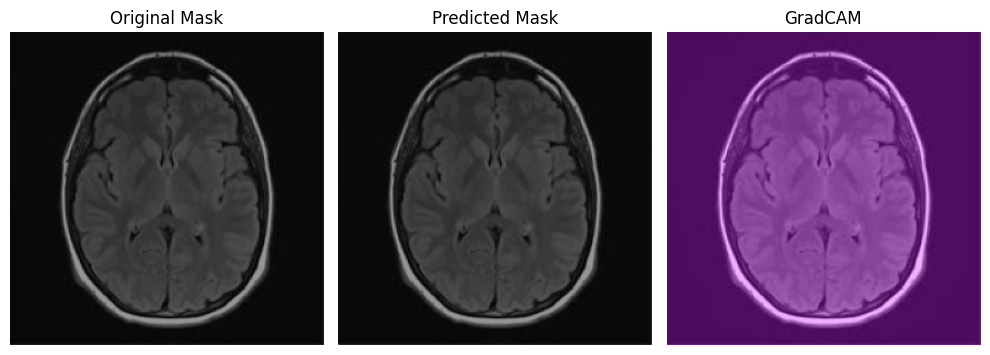

100/100 [==============================] - 26s 255ms/step - loss: 0.1905 - iou_score: 0.7294 - f1-score: 0.8350 - val_loss: 0.2326 - val_iou_score: 0.6885 - val_f1-score: 0.8036
Epoch 35/50
1/1 [==============================] - 0s 25ms/step


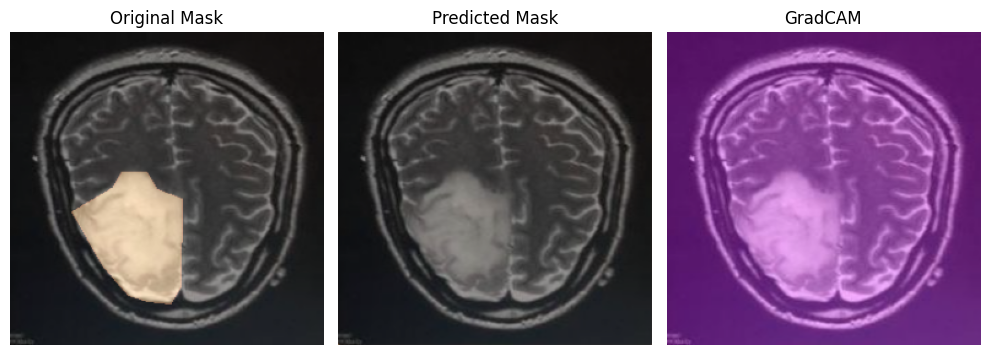

100/100 [==============================] - 23s 233ms/step - loss: 0.1916 - iou_score: 0.7305 - f1-score: 0.8362 - val_loss: 0.2314 - val_iou_score: 0.6843 - val_f1-score: 0.8014
Epoch 36/50
1/1 [==============================] - 0s 29ms/step


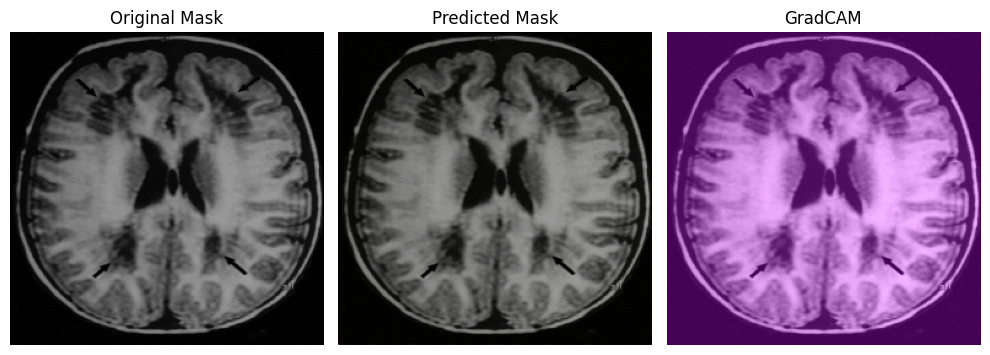

100/100 [==============================] - 25s 250ms/step - loss: 0.1873 - iou_score: 0.7368 - f1-score: 0.8377 - val_loss: 0.2015 - val_iou_score: 0.7220 - val_f1-score: 0.8339
Epoch 37/50
1/1 [==============================] - 0s 23ms/step


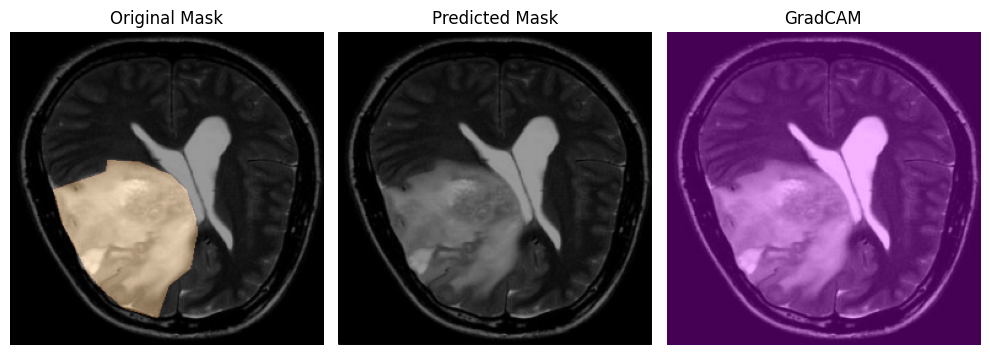

100/100 [==============================] - 25s 254ms/step - loss: 0.1870 - iou_score: 0.7314 - f1-score: 0.8375 - val_loss: 0.2409 - val_iou_score: 0.6875 - val_f1-score: 0.8081
Epoch 38/50
1/1 [==============================] - 0s 24ms/step


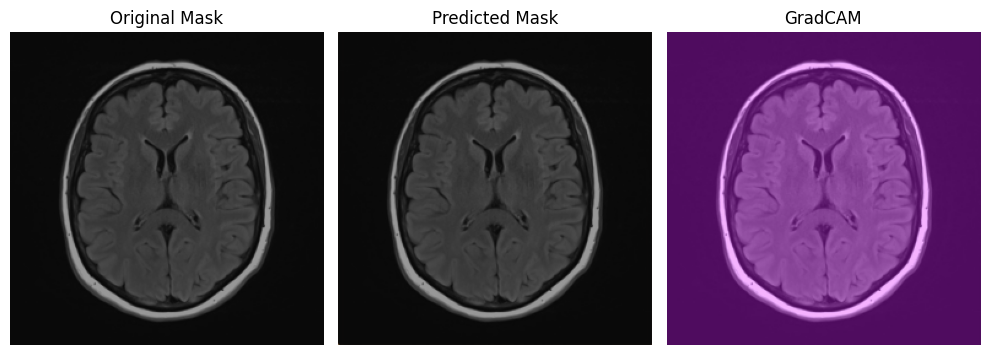

100/100 [==============================] - 26s 257ms/step - loss: 0.1885 - iou_score: 0.7317 - f1-score: 0.8370 - val_loss: 0.1804 - val_iou_score: 0.7358 - val_f1-score: 0.8451
Epoch 39/50
1/1 [==============================] - 0s 26ms/step


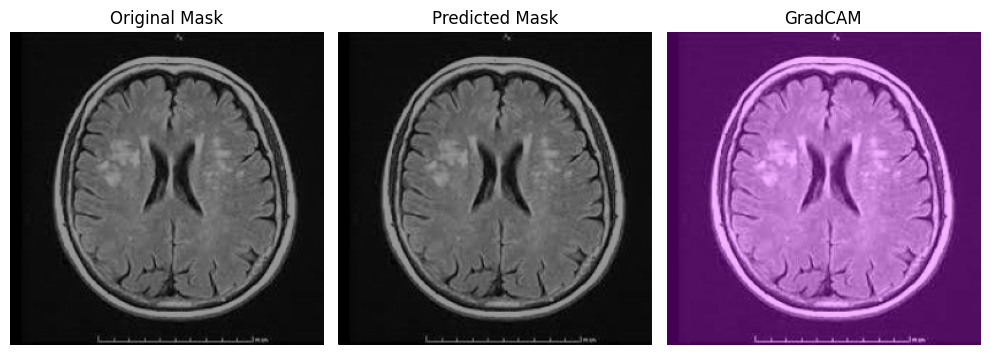

100/100 [==============================] - 25s 250ms/step - loss: 0.1597 - iou_score: 0.7679 - f1-score: 0.8640 - val_loss: 0.2326 - val_iou_score: 0.6914 - val_f1-score: 0.8073
Epoch 40/50
1/1 [==============================] - 0s 27ms/step


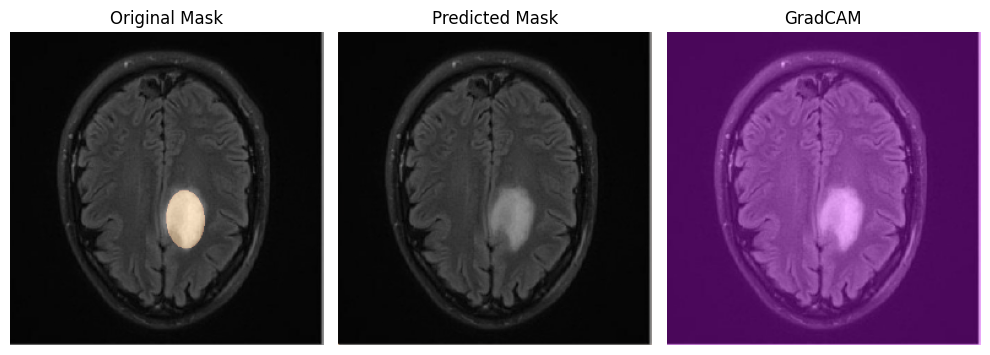

100/100 [==============================] - 26s 262ms/step - loss: 0.1575 - iou_score: 0.7691 - f1-score: 0.8647 - val_loss: 0.2184 - val_iou_score: 0.7047 - val_f1-score: 0.8192
Epoch 41/50
1/1 [==============================] - 0s 23ms/step


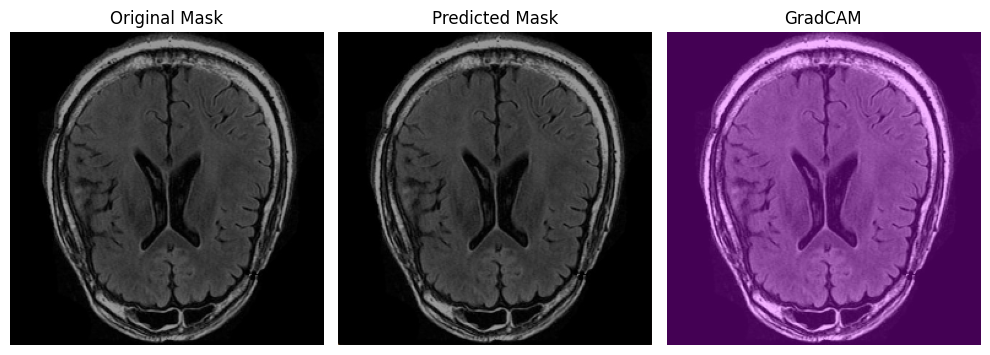

100/100 [==============================] - 25s 248ms/step - loss: 0.1631 - iou_score: 0.7629 - f1-score: 0.8601 - val_loss: 0.2418 - val_iou_score: 0.6759 - val_f1-score: 0.7939
Epoch 42/50
1/1 [==============================] - 0s 23ms/step


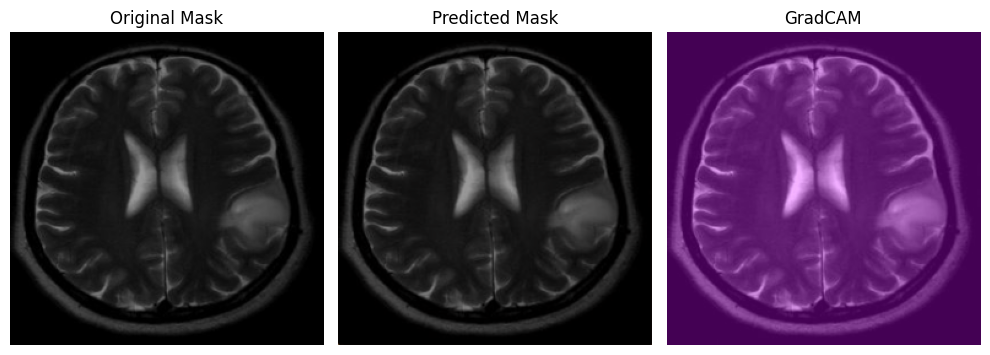

100/100 [==============================] - 26s 255ms/step - loss: 0.1813 - iou_score: 0.7383 - f1-score: 0.8430 - val_loss: 0.2043 - val_iou_score: 0.7261 - val_f1-score: 0.8319
Epoch 43/50
1/1 [==============================] - 0s 22ms/step


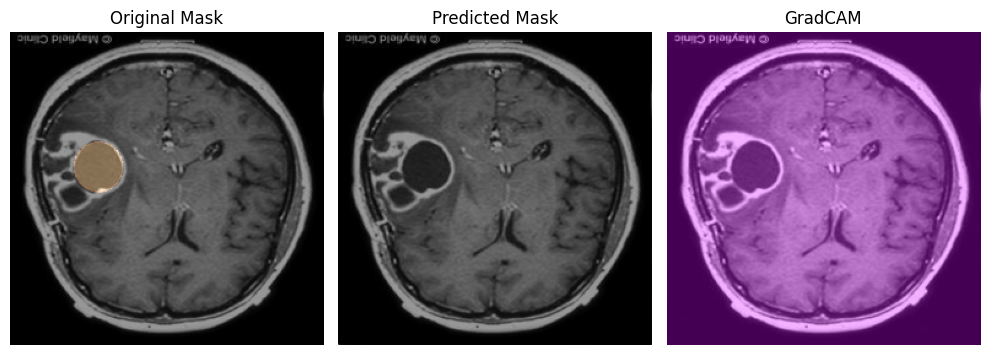

100/100 [==============================] - 26s 257ms/step - loss: 0.1653 - iou_score: 0.7594 - f1-score: 0.8571 - val_loss: 0.1942 - val_iou_score: 0.7335 - val_f1-score: 0.8393
Epoch 44/50
1/1 [==============================] - 0s 21ms/step


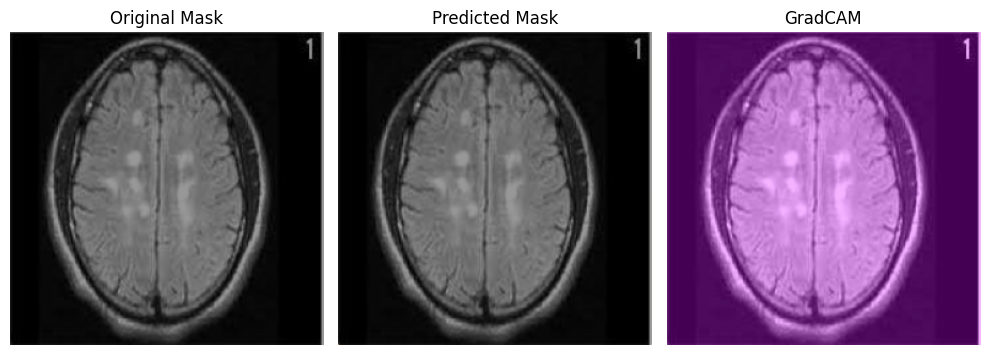

100/100 [==============================] - 26s 262ms/step - loss: 0.1687 - iou_score: 0.7568 - f1-score: 0.8538 - val_loss: 0.2229 - val_iou_score: 0.6951 - val_f1-score: 0.8104
Epoch 45/50
1/1 [==============================] - 0s 32ms/step


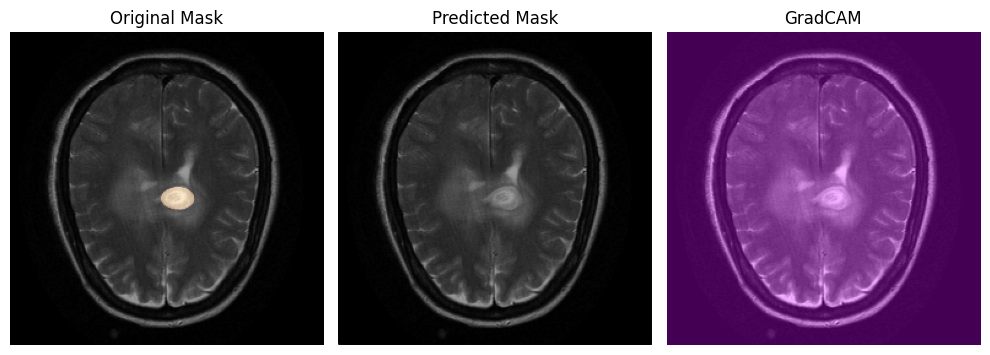

100/100 [==============================] - 25s 248ms/step - loss: 0.1713 - iou_score: 0.7543 - f1-score: 0.8526 - val_loss: 0.1966 - val_iou_score: 0.7340 - val_f1-score: 0.8384
Epoch 46/50
1/1 [==============================] - 0s 21ms/step


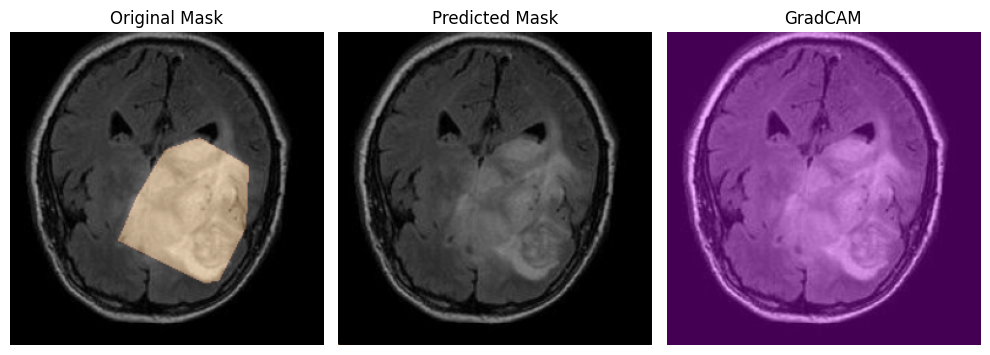

100/100 [==============================] - 27s 272ms/step - loss: 0.1673 - iou_score: 0.7563 - f1-score: 0.8559 - val_loss: 0.2550 - val_iou_score: 0.6501 - val_f1-score: 0.7792
Epoch 47/50
1/1 [==============================] - 0s 21ms/step


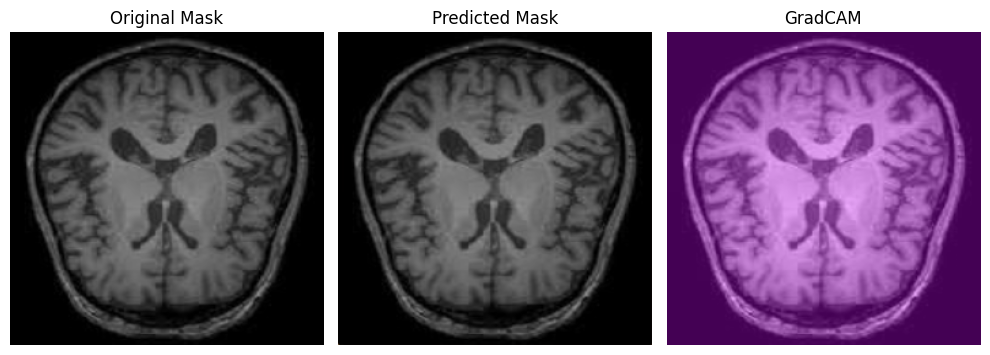

100/100 [==============================] - 26s 259ms/step - loss: 0.1542 - iou_score: 0.7745 - f1-score: 0.8669 - val_loss: 0.2200 - val_iou_score: 0.7016 - val_f1-score: 0.8144
Epoch 48/50
1/1 [==============================] - 0s 21ms/step


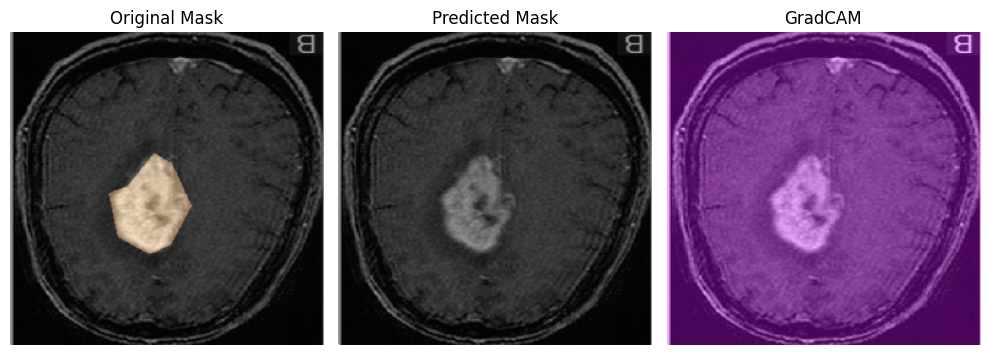

100/100 [==============================] - 26s 263ms/step - loss: 0.1607 - iou_score: 0.7673 - f1-score: 0.8628 - val_loss: 0.1886 - val_iou_score: 0.7417 - val_f1-score: 0.8415
Epoch 49/50
1/1 [==============================] - 0s 22ms/step


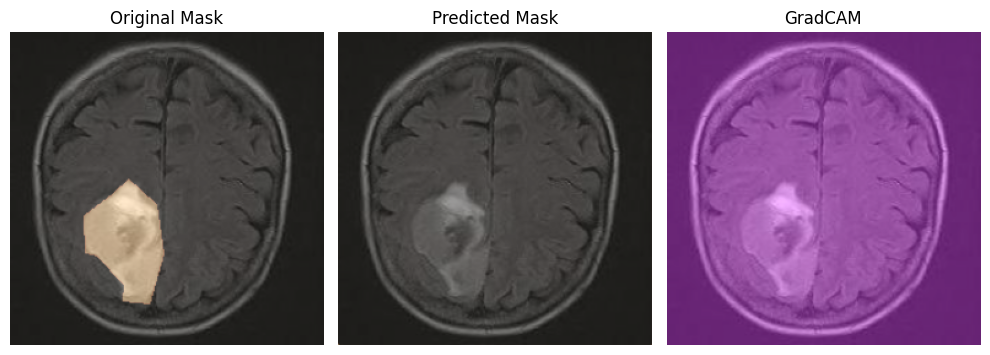

100/100 [==============================] - 27s 266ms/step - loss: 0.1513 - iou_score: 0.7768 - f1-score: 0.8694 - val_loss: 0.1994 - val_iou_score: 0.7335 - val_f1-score: 0.8368
Epoch 50/50
1/1 [==============================] - 0s 22ms/step


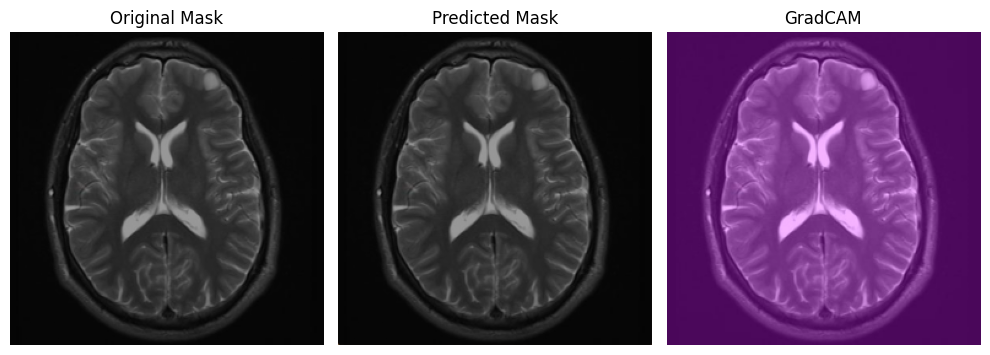

100/100 [==============================] - 27s 265ms/step - loss: 0.1580 - iou_score: 0.7709 - f1-score: 0.8636 - val_loss: 0.1969 - val_iou_score: 0.7218 - val_f1-score: 0.8321


In [ ]:
model=Unet_model()

# Callbacks
cb = [# EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
      #ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
      ShowProgress()]

history = model.fit(
                    seg_brain_train,
                    epochs=50,
                    validation_data=seg_brain_val,
                    callbacks=cb
)


In [ ]:
model_name='U-net_model_brain_seg.h5'
save_mode(model,model_name)

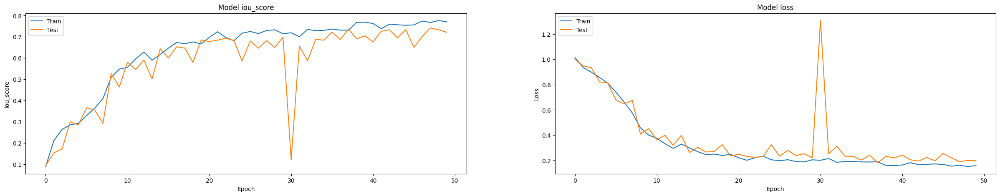

In [ ]:
Plot_train_val_iou_score(history)

**Model Evaluation**

In [ ]:
scores = model.evaluate_generator(seg_brain_test)
print("Loss: {:.5}".format(scores[0]))

print("Mean IOU Score: {:.5}".format(scores[1]))

<ipython-input-120-48c38e08f841>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(seg_brain_test)


Loss: 0.30518
Mean IOU Score: 0.592


In [ ]:
len(seg_brain_test_df)

In [ ]:
test_image_paths=seg_brain_test_df['img_name'].iloc[:50]
test_mask_paths=seg_brain_test_df['label'].iloc[:50]
segmentation_test_prediction(test_image_paths,test_mask_paths)

### **Model breast segmentation**

Epoch 1/50
1/1 [==============================] - 0s 475ms/step


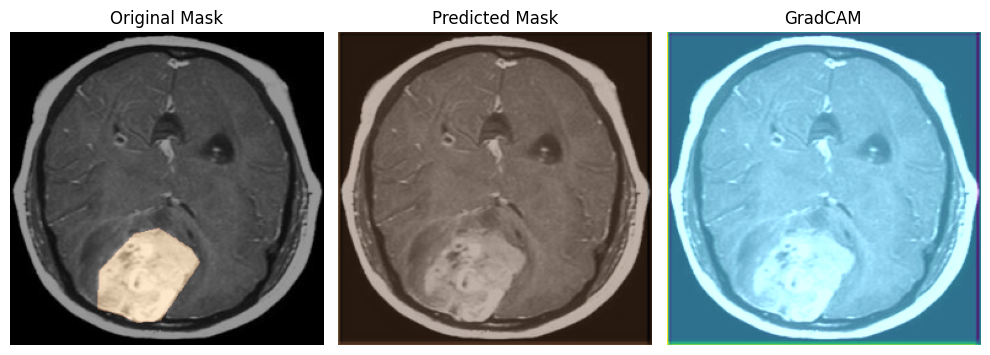

136/136 [==============================] - 85s 536ms/step - loss: 0.9360 - iou_score: 0.0862 - f1-score: 0.1564 - val_loss: 0.9048 - val_iou_score: 0.1019 - val_f1-score: 0.1826
Epoch 2/50
1/1 [==============================] - 0s 20ms/step


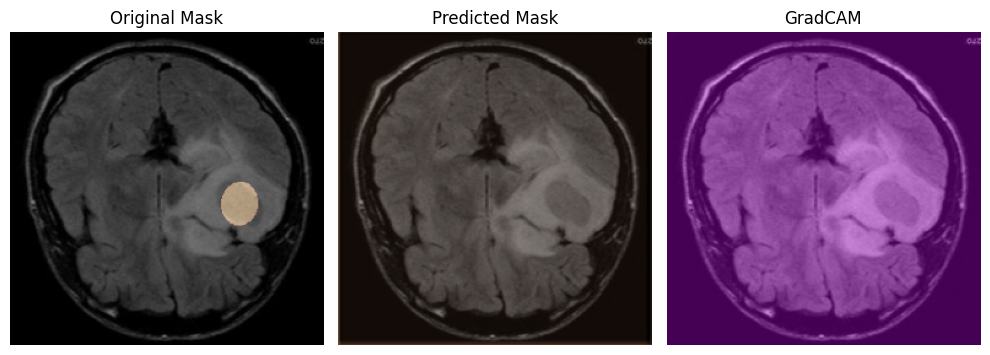

136/136 [==============================] - 18s 134ms/step - loss: 0.8911 - iou_score: 0.1092 - f1-score: 0.1945 - val_loss: 0.8672 - val_iou_score: 0.1065 - val_f1-score: 0.1887
Epoch 3/50
1/1 [==============================] - 0s 34ms/step


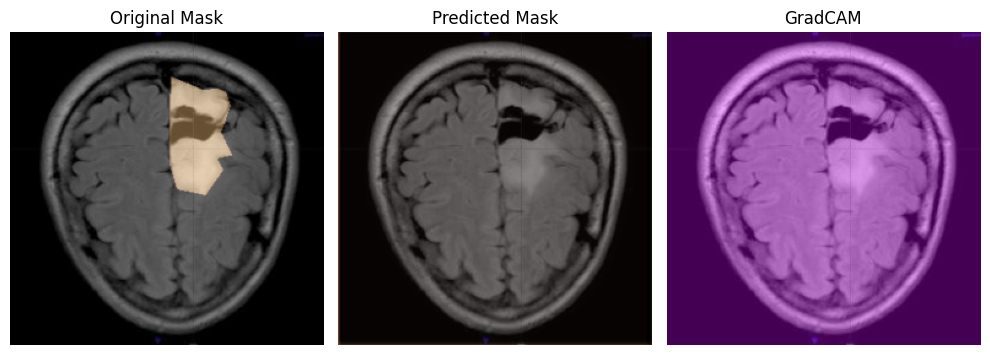

136/136 [==============================] - 19s 140ms/step - loss: 0.8614 - iou_score: 0.1601 - f1-score: 0.2702 - val_loss: 0.8463 - val_iou_score: 0.1703 - val_f1-score: 0.2829
Epoch 4/50
1/1 [==============================] - 0s 20ms/step


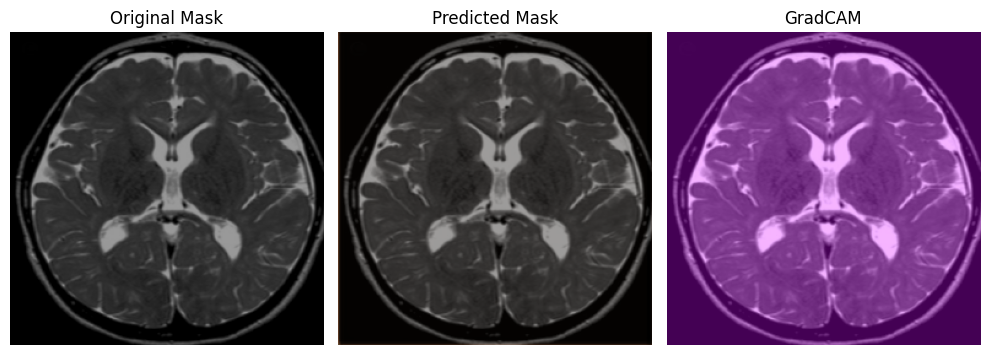

136/136 [==============================] - 19s 137ms/step - loss: 0.8177 - iou_score: 0.2261 - f1-score: 0.3575 - val_loss: 0.7935 - val_iou_score: 0.2606 - val_f1-score: 0.3917
Epoch 5/50
1/1 [==============================] - 0s 33ms/step


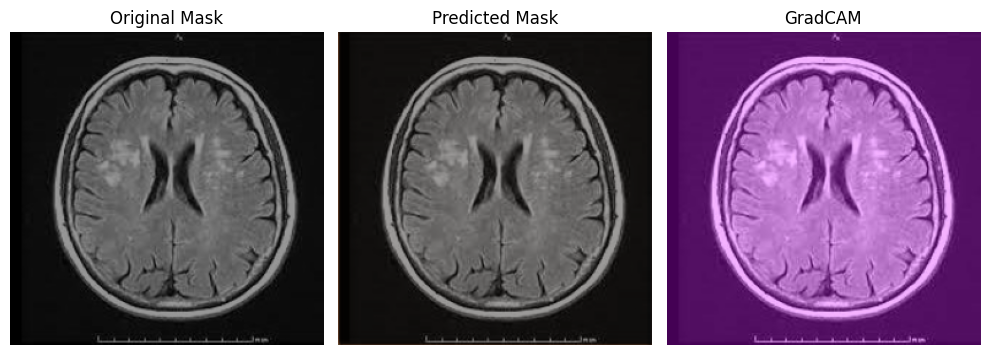

136/136 [==============================] - 20s 144ms/step - loss: 0.7491 - iou_score: 0.2939 - f1-score: 0.4371 - val_loss: 0.7688 - val_iou_score: 0.2633 - val_f1-score: 0.3973
Epoch 6/50
1/1 [==============================] - 0s 22ms/step


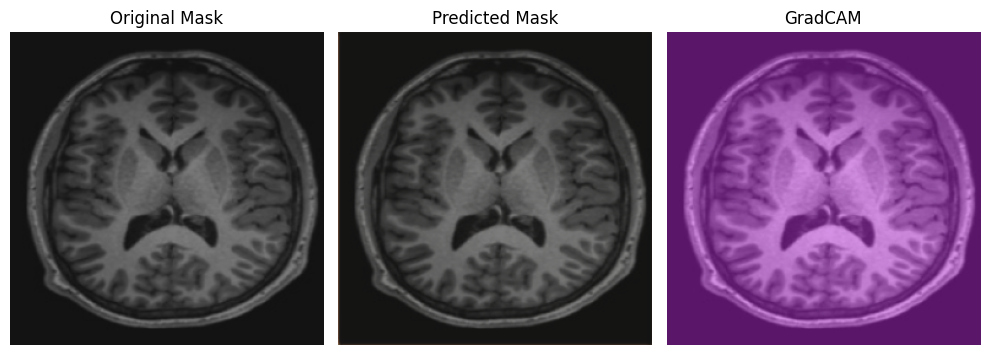

136/136 [==============================] - 19s 143ms/step - loss: 0.6616 - iou_score: 0.3583 - f1-score: 0.5099 - val_loss: 0.7108 - val_iou_score: 0.3139 - val_f1-score: 0.4546
Epoch 7/50
1/1 [==============================] - 0s 34ms/step


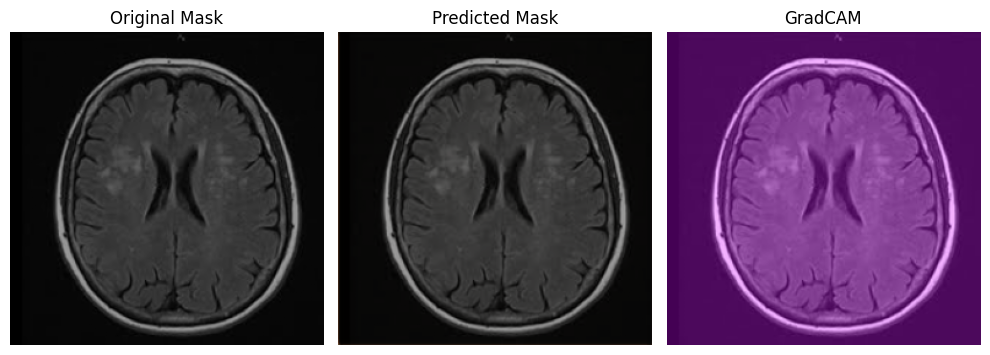

136/136 [==============================] - 20s 147ms/step - loss: 0.6199 - iou_score: 0.3837 - f1-score: 0.5315 - val_loss: 0.6020 - val_iou_score: 0.3890 - val_f1-score: 0.5316
Epoch 8/50
1/1 [==============================] - 0s 22ms/step


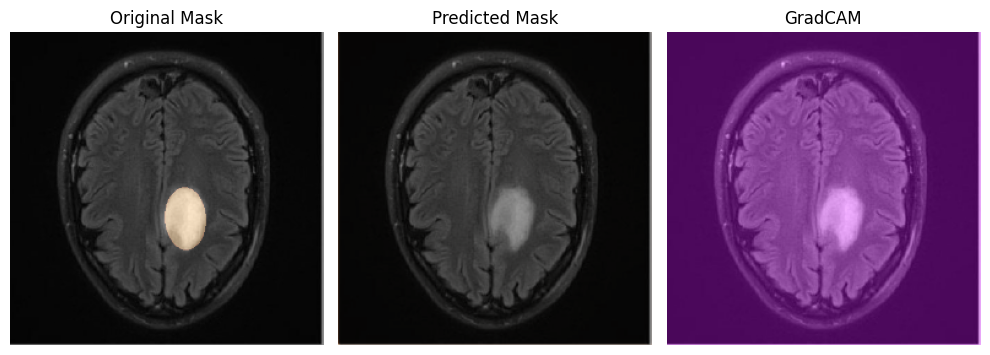

136/136 [==============================] - 19s 142ms/step - loss: 0.5679 - iou_score: 0.4174 - f1-score: 0.5653 - val_loss: 0.5885 - val_iou_score: 0.3865 - val_f1-score: 0.5211
Epoch 9/50
1/1 [==============================] - 0s 22ms/step


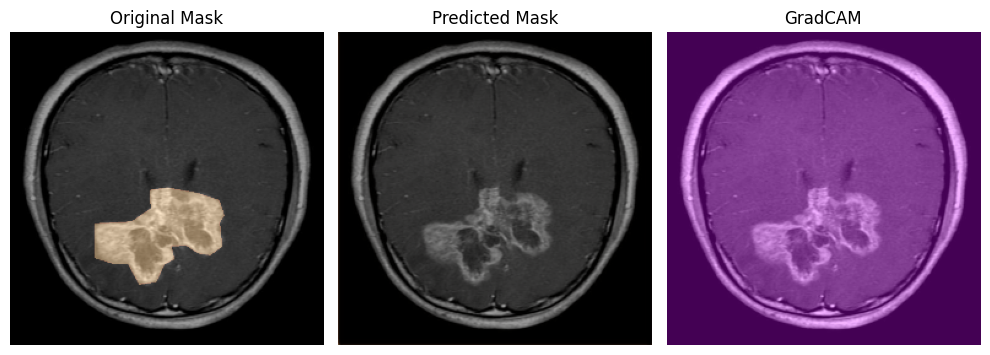

136/136 [==============================] - 21s 151ms/step - loss: 0.5433 - iou_score: 0.4341 - f1-score: 0.5779 - val_loss: 0.6125 - val_iou_score: 0.3860 - val_f1-score: 0.5219


In [ ]:
model=Unet_model()

cb = [# EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
      #ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
      ShowProgress()]

history = model.fit(
                    seg_breast_train,
                    epochs=50,
                    validation_data=seg_breast_val,
                    callbacks=cb
)


In [ ]:
model_name='U-net_model_breast_seg.h5'
save_mode(model,model_name)

In [ ]:
Plot_train_val_iou_score(history)

**Model Evaluation**

In [ ]:
scores = model.evaluate_generator(seg_breast_test)

print("Loss: {:.5}".format(scores[0]))

print("Mean IOU Score: {:.5}".format(scores[1]))

In [ ]:
test_image_paths=seg_breast_test_df['img_name'].iloc[:10]
test_mask_paths=seg_breast_test_df['label'].iloc[:10]
segmentation_test_prediction(test_image_paths,test_mask_paths)

### **Calculate the Width and the Height of the Musk**

In [ ]:
def calc_width_height(path):
  # Load the binary mask image
  mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

  # Find the contours of the binary mask
  contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Get the extreme points of the contours
  leftmost = tuple(contours[0][contours[0][:, :, 0].argmin()][0])
  rightmost = tuple(contours[0][contours[0][:, :, 0].argmax()][0])
  topmost = tuple(contours[0][contours[0][:, :, 1].argmin()][0])
  bottommost = tuple(contours[0][contours[0][:, :, 1].argmax()][0])

  # Calculate the width and height of the bounding box
  width = rightmost[0] - leftmost[0]
  height = bottommost[1] - topmost[1]

  print("Width:", width)
  print("Height:", height)

  return width,height

# **Multi-Cancer Identification and Segmentation**


In [ ]:
def find_width_height(img,model):
  tumor_segmentation_model = load_model(os.path.join(model_path,model_name))
  tumor_mask = tumor_segmentation_model.predict(img)
  segmented_image = np.multiply(img, tumor_mask)
  width,height =calc_width_height(img_path)

In [ ]:
map1={0:'brain',1:'breast'}
map2={0:'tumor',1:'notumor'}
map3={0:'benign',1:'malignant',2:'normal'}

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

model_path='/content/drive/MyDrive/Models/'
# Load the image
img = cv2.imread('path/to/image.jpg')

# Classify the image
model_name='VGG16_model_clf_all.h5'
classification_model = load_model(os.path.join(model_path,model_name))
image_type = classification_model.predict(img)
image_type=map1[image_type]

# Detect the presence of tumor
if image_type == 'brain':
    model_name='VGG16_model_brain_clf.h5'
    tumor_detection_model = load_model(os.path.join(model_path,model_name))
    image_type = tumor_detection_model.predict(img)
    image_type=map2[image_type]
    if image_type=='tumor':
      model_name='U-net_model_brain_seg.h5'
      
    else:
      segmented_image = img

else:
    model_name='VGG16_model_breast_clf.h5'
    tumor_detection_model = load_model(os.path.join(model_path,model_name))
    image_type = tumor_detection_model.predict(img)
    image_type=map3[image_type]
    if image_type!='normal':
      model_name='U-net_model_breast_seg.h5'
      tumor_segmentation_model = load_model(os.path.join(model_path,model_name))
      tumor_mask = tumor_segmentation_model.predict(img)
      segmented_image = np.multiply(img, tumor_mask)
      width,height =calc_width_height(img_path)
    else:
      segmented_image = img


# Display the results
plt.imshow(segmented_image)
plt.show()